<a href="https://colab.research.google.com/github/monya217/BreastCancer/blob/main/Breast_Cancer_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


Project Submission
Team Members -


1.   Manasvi Jindal 03101192022 AI/ML IGDTUW
2.   Monya Mehta 03401192022 AI/ML IGDTUW




# **Loading the data**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Importing the necessary libraries

In [ ]:
!pip install tf_explain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.0 MB/s eta 0:00:00


## Importing the libraries

In [ ]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras.utils import img_to_array
import tensorflow as tf
import os
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import Dropout
from keras.layers import Concatenate
from keras.layers import MaxPooling2D
from keras.layers import Conv2DTranspose
from keras import Model
from sklearn.model_selection import train_test_split
from keras import backend as K
from keras.losses import BinaryCrossentropy
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
from keras.models import Model
from keras.layers import Layer
from keras.layers import Dropout
from keras.layers import UpSampling2D
from keras.layers import concatenate
from keras.layers import Add
from keras.layers import Multiply
from keras.layers import Input
from keras.layers import BatchNormalization
from keras.callbacks import Callback
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from tf_explain.core.grad_cam import GradCAM
from keras.metrics import MeanIoU
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical
import pandas as pd
import seaborn
from numpy.random import randint
from keras.layers import BatchNormalization
from keras.models import Sequential
from keras.layers import LeakyReLU
from keras.optimizers import Adam
from keras.layers import Flatten
from keras.layers import Dense
from keras.utils import plot_model
from tensorflow.keras import layers
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tensorflow.keras.applications.vgg16 import VGG16
from keras.layers import MaxPool2D
from keras.layers import Activation, Reshape, Dense
from keras.layers import AveragePooling2D
from tensorflow.keras.applications import ResNet50
from keras.layers import ReLU
import shutil
import pandas

In [ ]:
path = '/content/drive/MyDrive/Dataset_BUSI_with_GT/'

#Classification using VGG

## Loading the data

In [ ]:
os.listdir(path)

['benign', 'malignant', 'normal']

In [ ]:
info = os.listdir(path)

In [ ]:
images = []
labels = []
masks = []
label_num = -1
image_dict = {}
for label_class in os.listdir(path):
    new_path = os.path.join(path, label_class)
    label_num += 1
    for img in os.listdir(new_path):
        if 'mask' not in img:
            image_id = img.split('.')[0]
            mask_files = [mask for mask in os.listdir(new_path) if f'{image_id}_mask' in mask]
            labels.append(label_num)
            x = cv2.imread(os.path.join(new_path, img), cv2.IMREAD_GRAYSCALE)
            images.append(img_to_array(Image.fromarray(cv2.resize(x, (128, 128)))))
            if mask_files:
                combined_mask = np.zeros((128, 128), dtype=np.uint8)
                for mask_file in mask_files:
                    mask = cv2.imread(os.path.join(new_path, mask_file), cv2.IMREAD_GRAYSCALE)
                    mask = cv2.resize(mask, (128, 128))
                    combined_mask = np.maximum(combined_mask, mask)
                masks.append(img_to_array(Image.fromarray(combined_mask).convert('L')))

print("Images and masks processed.")


Images and masks processed.


In [ ]:
images = np.array(images)
labels = np.array(labels)
masks = np.array(masks)

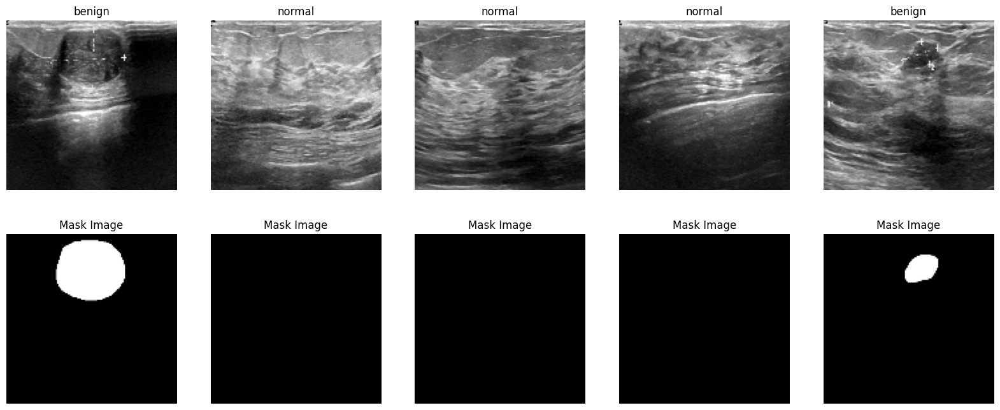

In [ ]:
plt.figure(figsize = (20,8))
for i in range(5) :
    x = np.random.randint(0,780)
    plt.subplot(2,5,i+1)
    plt.imshow(images[x], 'gray')
    plt.title(info[labels[x]])
    plt.axis('off')
    plt.subplot(2,5,i+6)
    plt.imshow(masks[x], 'gray')
    plt.title('Mask Image')
    plt.axis('off')
plt.show()

In [ ]:
images/= 255.0

In [ ]:
labels = to_categorical(labels)

In [ ]:
print(images.shape)
print(labels.shape)
print(masks.shape)

In [ ]:
print(images.max())
print(images.min())

1.0
0.0


Text(0.5, 1.0, 'Distribution of classes accross the entire dataset')

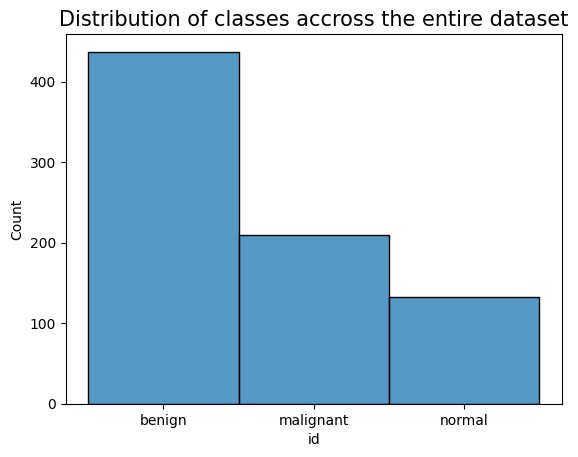

In [ ]:
seaborn.histplot(data = pandas.DataFrame({'id' : [info[p] for p in np.argmax(labels, axis = 1)]}), x = 'id')
plt.title('Distribution of classes accross the entire dataset', fontsize = 15)

##Train test split

In [ ]:
def greytocolor(img):
  colored_img = img.repeat(3,axis = -1)
  return colored_img

In [ ]:
colored_images = []
for i in range(len(images)):
    colored_img = greytocolor(images[i])
    colored_images.append(colored_img)
colored_images = np.array(colored_images)

In [ ]:
img_train, img_test, labels_train, labels_test = train_test_split(colored_images, labels, test_size = 0.1, shuffle = True, random_state = 1)

In [ ]:
print(img_train.shape)
print(labels_train.shape)

(702, 128, 128, 3)
(702, 3)


In [ ]:
print(img_test.shape)
print(labels_test.shape)

(78, 128, 128, 3)
(78, 3)


## Building Model

In [ ]:
vgg_model = VGG16(input_shape = (128, 128, 3),
include_top = False,
weights = 'imagenet')

58889256/58889256 [==============================] - 1s 0us/step


In [ ]:
for layer in vgg_model.layers:
    layer.trainable = False

In [ ]:
def VGG():

    model = Sequential()
    model.add(vgg_model)

    model.add(Flatten())
    model.add(BatchNormalization())
    model.add(Dense(512,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(256,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(128,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(64,activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(3,activation='softmax'))

    model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['acc'])

    return model

In [ ]:
vgg16_model = VGG()
vgg16_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 batch_normalization (Batch  (None, 8192)              32768     
 Normalization)                                                  
                                                                 
 dense (Dense)               (None, 512)               4194816   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                        

## Training of model

In [ ]:
checkp = ModelCheckpoint('./vgg_classifier_70_v3.h5', monitor = 'val_loss', save_best_only = True, verbose = 1)

In [ ]:
history = vgg16_model.fit(img_train,labels_train,batch_size = 32,
                    validation_data = (img_test, labels_test),
                    epochs=70, callbacks=[checkp])

Epoch 1/70
22/22 [==============================] - ETA: 0s - loss: 1.7501 - acc: 0.4316
Epoch 1: val_loss improved from inf to 0.88725, saving model to ./vgg_classifier_70_v3.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


22/22 [==============================] - 24s 227ms/step - loss: 1.7501 - acc: 0.4316 - val_loss: 0.8872 - val_acc: 0.5897
Epoch 2/70
22/22 [==============================] - ETA: 0s - loss: 1.5814 - acc: 0.4986
Epoch 2: val_loss improved from 0.88725 to 0.86572, saving model to ./vgg_classifier_70_v3.h5
22/22 [==============================] - 1s 65ms/step - loss: 1.5814 - acc: 0.4986 - val_loss: 0.8657 - val_acc: 0.6667
Epoch 3/70
21/22 [===========================>..] - ETA: 0s - loss: 1.2942 - acc: 0.5655
Epoch 3: val_loss did not improve from 0.86572
22/22 [==============================] - 1s 48ms/step - loss: 1.2960 - acc: 0.5641 - val_loss: 0.8833 - val_acc: 0.6923
Epoch 4/70
21/22 [===========================>..] - ETA: 0s - loss: 1.1634 - acc: 0.5417
Epoch 4: val_loss did not improve from 0.86572
22/22 [==============================] - 1s 50ms/step - loss: 1.1585 - acc: 0.5427 - val_loss: 0.8785 - val_acc: 0.7051
Epoch 5/70
21/22 [===========================>..] - ETA: 0s - l

Text(0.5, 1.0, 'Accuracy wrt. Epochs')

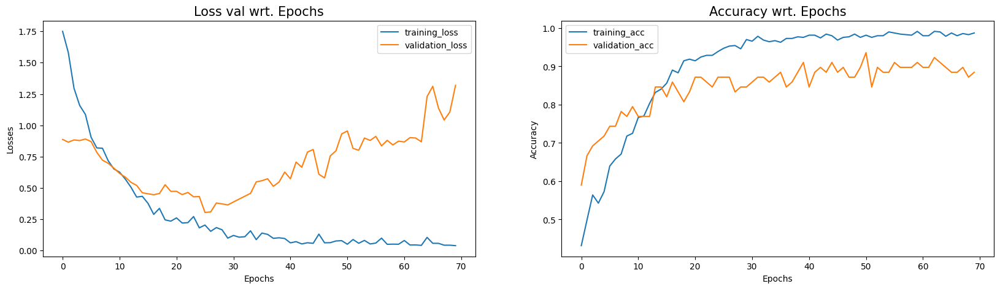

In [ ]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training_loss', 'validation_loss'])
plt.xlabel('Epochs')
plt.ylabel('Losses')
plt.title('Loss val wrt. Epochs', fontsize = 15)
plt.subplot(1,2,2)
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.legend(['training_acc', 'validation_acc'])
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy wrt. Epochs', fontsize = 15)

In [ ]:
vgg16_model = load_model('/content/drive/MyDrive/breast cancer models/vgg_classifier_70_v3.h5')

In [ ]:
img_test_prediction = vgg16_model.predict(img_test)

3/3 [==============================] - 1s 65ms/step


In [ ]:
img_test_prediction = np.argmax(img_test_prediction, axis = 1)
labels_test = np.argmax(labels_test, axis = 1)

In [ ]:
print('Accuracy : ' + str(accuracy_score(labels_test, img_test_prediction)))
print(classification_report(labels_test, img_test_prediction, target_names = info))

Accuracy : 0.8846153846153846
              precision    recall  f1-score   support

      normal       0.81      0.93      0.87        14
      benign       0.93      0.86      0.89        44
   malignant       0.86      0.90      0.88        20

    accuracy                           0.88        78
   macro avg       0.87      0.90      0.88        78
weighted avg       0.89      0.88      0.89        78



In [ ]:
cm = confusion_matrix(labels_test,img_test_prediction)

Text(0.5, 63.222222222222186, 'Predicted')

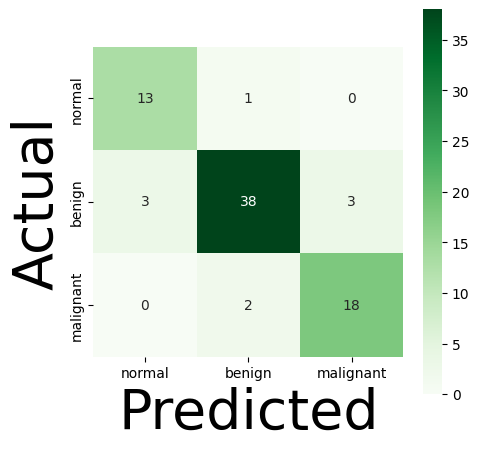

In [ ]:
plt.figure(figsize = (5,5))
ax = seaborn.heatmap(cm, cmap=plt.cm.Greens, annot=True, square=True, xticklabels = info, yticklabels = info)
ax.set_ylabel('Actual', fontsize=40)
ax.set_xlabel('Predicted', fontsize=40)

Checking confusion matrix for entire dataset

In [ ]:
colored_images.shape

(780, 128, 128, 3)

In [ ]:
image_prediction = vgg16_model.predict(colored_images)

25/25 [==============================] - 1s 47ms/step


In [ ]:
image_prediction = np.argmax(image_prediction, axis = 1)
labels = np.argmax(labels, axis = 1)

In [ ]:
image_prediction.shape

(780,)

In [ ]:
labels.shape

(780,)

In [ ]:
print('Accuracy : ' + str(accuracy_score(labels, image_prediction)))
print(classification_report(labels, image_prediction, target_names = info))

Accuracy : 0.9846153846153847
              precision    recall  f1-score   support

      normal       0.97      0.99      0.98       133
      benign       0.99      0.98      0.99       437
   malignant       0.98      0.99      0.98       210

    accuracy                           0.98       780
   macro avg       0.98      0.99      0.98       780
weighted avg       0.98      0.98      0.98       780



In [ ]:
cm = confusion_matrix(labels,image_prediction)
cm

array([[132,   1,   0],
       [  4, 429,   4],
       [  0,   3, 207]])

Text(0.5, 63.222222222222186, 'Predicted')

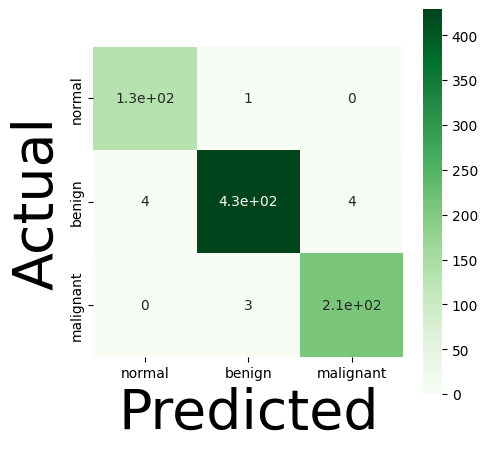

In [ ]:
plt.figure(figsize = (5,5))
ax = seaborn.heatmap(cm, cmap=plt.cm.Greens, annot=True, square=True, xticklabels = info, yticklabels = info)
ax.set_ylabel('Actual', fontsize=40)
ax.set_xlabel('Predicted', fontsize=40)

## Creating new dataset from prediction

In [ ]:
benign_images = []
malignant_images = []
normal_images = []
benign_masks = []
malignant_masks = []
normal_masks = []
image_prediction = vgg16_model.predict(colored_images)
image_prediction = np.argmax(image_prediction, axis = 1)
for i in range(len(colored_images)):
    img = colored_images[i]
    prediction = image_prediction[i]
    mask = masks[i]

    if prediction == 1:
        benign_images.append(img)
        benign_masks.append(mask)
    elif prediction == 2:
        malignant_images.append(img)
        malignant_masks.append(mask)
    elif prediction == 0:
        normal_images.append(img)
        normal_masks.append(mask)

25/25 [==============================] - 1s 44ms/step


In [ ]:
print(len(benign_images))   #437
print(len(malignant_images)) #210
print(len(normal_images))  #133

433
211
136


In [ ]:
print(len(benign_masks))   #437
print(len(malignant_masks)) #210
print(len(normal_masks))

433
211
136


In [ ]:
new_dataset_path = '/content/drive/MyDrive/Segmentation dataset'
os.makedirs(new_dataset_path, exist_ok=True)

In [ ]:
path_benign_image = '/content/drive/MyDrive/Segmentation dataset/benign/image'
path_malignant_image = '/content/drive/MyDrive/Segmentation dataset/malignant/image'
path_normal_image = '/content/drive/MyDrive/Segmentation dataset/normal/image'
path_benign_mask = '/content/drive/MyDrive/Segmentation dataset/benign/mask'
path_malignant_mask = '/content/drive/MyDrive/Segmentation dataset/malignant/mask'
path_normal_mask = '/content/drive/MyDrive/Segmentation dataset/normal/mask'

os.makedirs(path_benign_image, exist_ok=True)
os.makedirs(path_malignant_image, exist_ok=True)
os.makedirs(path_normal_image, exist_ok=True)
os.makedirs(path_benign_mask, exist_ok=True)
os.makedirs(path_malignant_mask, exist_ok=True)
os.makedirs(path_normal_mask, exist_ok=True)

for i, img in enumerate(benign_images):
    filename = f'benign_{i}.jpg'
    cv2.imwrite(os.path.join(path_benign_image, filename), img*255)
    mask_filename = f'benign_{i}_mask.jpg'
    cv2.imwrite(os.path.join(path_benign_mask, mask_filename), benign_masks[i])

for i, img in enumerate(malignant_images):
    filename = f'malignant_{i}.jpg'
    cv2.imwrite(os.path.join(path_malignant_image, filename), img*255)
    mask_filename = f'malignant_{i}_mask.jpg'
    cv2.imwrite(os.path.join(path_malignant_mask, mask_filename), malignant_masks[i])


for i, img in enumerate(normal_images):
    filename = f'normal_{i}.jpg'
    cv2.imwrite(os.path.join(path_normal_image, filename), img*255)
    mask_filename = f'normal_{i}_mask.jpg'
    cv2.imwrite(os.path.join(path_normal_mask, mask_filename), normal_masks[i])


In [ ]:
benign_image = [f for f in os.listdir(path_benign_image) if os.path.isfile(os.path.join(path_benign_image, f))]
print("Number of bening images in segmentation dataset:",len(benign_image))
benign_mask = [f for f in os.listdir(path_benign_mask) if os.path.isfile(os.path.join(path_benign_mask, f))]
print("Number of bening masks in segmentation dataset:",len(benign_mask))

malignant_image = [f for f in os.listdir(path_malignant_image) if os.path.isfile(os.path.join(path_malignant_image, f))]
print("Number of malignant images in segmentation dataset:",len(malignant_image))
malignant_mask = [f for f in os.listdir(path_malignant_mask) if os.path.isfile(os.path.join(path_malignant_mask, f))]
print("Number of malignant masks in segmentation dataset:",len(malignant_mask))

normal_image = [f for f in os.listdir(path_normal_image) if os.path.isfile(os.path.join(path_normal_image, f))]
print("Number of normal images in segmentation dataset:",len(normal_image))
normal_mask = [f for f in os.listdir(path_normal_mask) if os.path.isfile(os.path.join(path_normal_mask, f))]
print("Number of normal masks in segmentation dataset:",len(normal_mask))


Number of bening images in segmentation dataset: 433
Number of bening masks in segmentation dataset: 433
Number of malignant images in segmentation dataset: 211
Number of malignant masks in segmentation dataset: 211
Number of normal images in segmentation dataset: 136
Number of normal masks in segmentation dataset: 136


# **Image Segmentation**

## Loading dataset

In [ ]:
img_b, mask_b = np.zeros((433, 128, 128, 1)), np.zeros((433, 128, 128, 1))
img_m, mask_m = np.zeros((211, 128, 128, 1)), np.zeros((211, 128, 128, 1))

In [ ]:
path_benign_image = '/content/drive/MyDrive/Segmentation dataset/benign/image'
path_malignant_image = '/content/drive/MyDrive/Segmentation dataset/malignant/image'
path_benign_mask = '/content/drive/MyDrive/Segmentation dataset/benign/mask'
path_malignant_mask = '/content/drive/MyDrive/Segmentation dataset/malignant/mask'

In [ ]:
for i in range(len(os.listdir(path_benign_image))):
  filename = os.listdir(path_benign_image)[i].split(".")
  img = cv2.imread(os.path.join(path_benign_image,os.listdir(path_benign_image)[i]),cv2.IMREAD_GRAYSCALE)
  pil_img = Image.fromarray (img)
  img_b[i] = img_to_array(pil_img)
  mask = cv2.imread(os.path.join(path_benign_mask,(filename[0]+"_mask."+filename[1])),cv2.IMREAD_GRAYSCALE)
  pil_mask = Image.fromarray (mask)
  mask_b[i] = img_to_array(pil_mask)

for i in range(len(os.listdir(path_malignant_image))):
  filename = os.listdir(path_malignant_image)[i].split(".")
  img = cv2.imread(os.path.join(path_malignant_image,os.listdir(path_malignant_image)[i]),cv2.IMREAD_GRAYSCALE)
  pil_img = Image.fromarray (img)
  img_m[i] = img_to_array(pil_img)
  mask = cv2.imread(os.path.join(path_malignant_mask,(filename[0]+"_mask."+filename[1])),cv2.IMREAD_GRAYSCALE)
  pil_mask = Image.fromarray (mask)
  mask_m[i] = img_to_array(pil_mask)

**Creating datasets for model training and validation**

In [ ]:
scan = np.concatenate((img_b, img_m), axis = 0)
mask = np.concatenate((mask_b, mask_m), axis = 0)

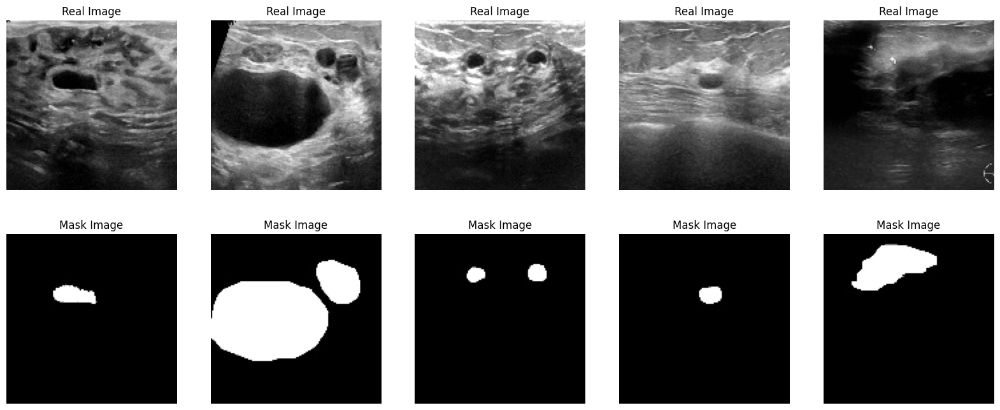

In [ ]:
plt.figure(figsize = (20,8))
for i in range(5) :
    plt.subplot(2,5,i+1)
    plt.imshow(scan[i+1], 'gray')
    plt.title('Real Image')
    plt.axis('off')

for i in range(5) :
    plt.subplot(2,5,i+6)
    plt.imshow(mask[i+1], 'gray')
    plt.title('Mask Image')
    plt.axis('off')
plt.show()

### **Data Preprocessing**

Normalization

In [ ]:
scan /= 255.0
mask /= 255.0

In [ ]:
print(scan.shape)
print(mask.shape)

(644, 128, 128, 1)
(644, 128, 128, 1)


Thresholding

In [ ]:
print(scan.max())
print(scan.min())

1.0
0.0


In [ ]:
print(mask.max())
print(mask.min())

1.0
0.0


In [ ]:
scan[scan > 1.0] = 1.0
mask[mask > 1.0] = 1.0

In [ ]:
print(scan.max())
print(scan.min())
print(mask.max())
print(mask.min())

1.0
0.0
1.0
0.0


**Visualization**

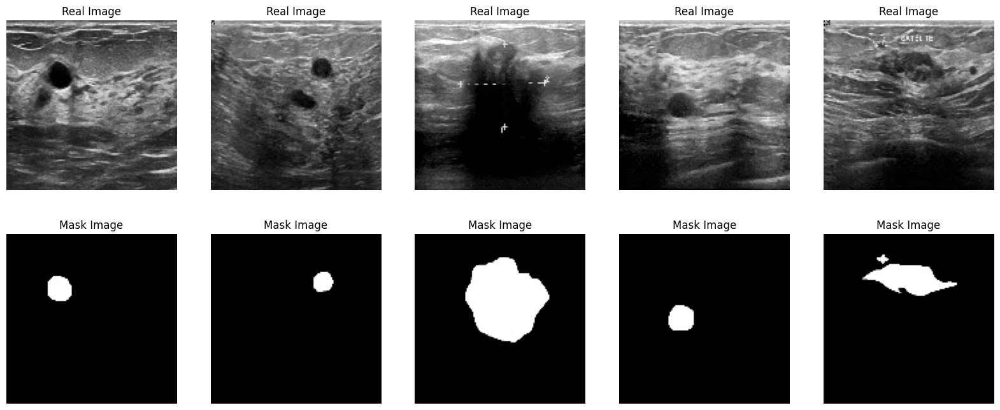

In [ ]:
plt.figure(figsize = (20,8))
for i in range(5) :
    x = np.random.randint(0,644)
    plt.subplot(2,5,i+1)
    plt.imshow(scan[x], 'gray')
    plt.title('Real Image')
    plt.axis('off')
    plt.subplot(2,5,i+6)
    plt.imshow(mask[x], 'gray')
    plt.title('Mask Image')
    plt.axis('off')
plt.show()

### **Train test split**

In [ ]:
scan_train, scan_test, mask_train, mask_test = train_test_split(scan, mask, test_size = 0.1, random_state = 1)

In [ ]:
print(scan_train.shape)
print(mask_train.shape)

(579, 128, 128, 1)
(579, 128, 128, 1)


In [ ]:
print(scan_test.shape)
print(mask_test.shape)

(65, 128, 128, 1)
(65, 128, 128, 1)


### Evaluation Metrics

In [ ]:
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
    return score

In [ ]:
def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

In [ ]:
def iou(y_true, y_pred):
    y_true = K.flatten(y_true)
    y_pred = K.flatten(y_pred)

    intersection = K.sum(y_true * y_pred)
    union = K.sum(y_true) + K.sum(y_pred) - intersection

    iou = intersection / (union + K.epsilon())

    return iou

## **U-net**

### Building the model

Contracting path

In [ ]:
inply = Input((128, 128, 1,))

conv1 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(inply)
conv1 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(conv1)
pool1 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv1)
drop1 = Dropout(0.2)(pool1)

conv2 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(drop1)
conv2 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(conv2)
pool2 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv2)
drop2 = Dropout(0.2)(pool2)

conv3 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(drop2)
conv3 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(conv3)
pool3 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv3)
drop3 = Dropout(0.2)(pool3)

conv4 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(drop3)
conv4 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(conv4)
pool4 = MaxPooling2D((2,2), strides = 2, padding = 'same')(conv4)
drop4 = Dropout(0.2)(pool4)

Bottleneck layer

In [ ]:
convm = Conv2D(2**10, (3,3), activation = 'relu', padding = 'same')(drop4)
convm = Conv2D(2**10, (3,3), activation = 'relu', padding = 'same')(convm)

Expanding layer

In [ ]:
tran5 = Conv2DTranspose(2**9, (2,2), strides = 2, padding = 'valid', activation = 'relu')(convm)
conc5 = Concatenate()([tran5, conv4])
conv5 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(conc5)
conv5 = Conv2D(2**9, (3,3), activation = 'relu', padding = 'same')(conv5)
drop5 = Dropout(0.1)(conv5)

tran6 = Conv2DTranspose(2**8, (2,2), strides = 2, padding = 'valid', activation = 'relu')(drop5)
conc6 = Concatenate()([tran6, conv3])
conv6 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(conc6)
conv6 = Conv2D(2**8, (3,3), activation = 'relu', padding = 'same')(conv6)
drop6 = Dropout(0.1)(conv6)

tran7 = Conv2DTranspose(2**7, (2,2), strides = 2, padding = 'valid', activation = 'relu')(drop6)
conc7 = Concatenate()([tran7, conv2])
conv7 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(conc7)
conv7 = Conv2D(2**7, (3,3), activation = 'relu', padding = 'same')(conv7)
drop7 = Dropout(0.1)(conv7)

tran8 = Conv2DTranspose(2**6, (2,2), strides = 2, padding = 'valid', activation = 'relu')(drop7)
conc8 = Concatenate()([tran8, conv1])
conv8 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(conc8)
conv8 = Conv2D(2**6, (3,3), activation = 'relu', padding = 'same')(conv8)
drop8 = Dropout(0.1)(conv8)

In [ ]:
outly = Conv2D(2**0, (1,1), activation = 'relu', padding = 'same')(drop8)
unet_model = Model(inputs = inply, outputs = outly, name = 'U-net')

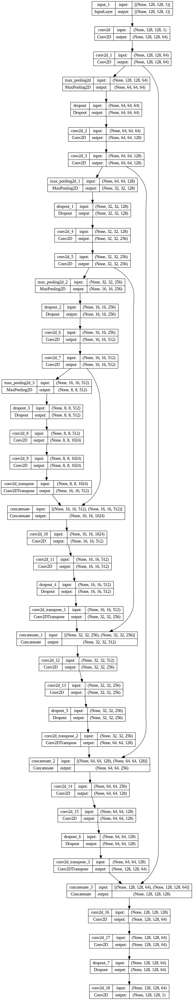

In [ ]:
keras.utils.plot_model(unet_model, './model_plot.png', show_shapes = True)

### Training

In [ ]:
unet_model.compile(loss = BinaryCrossentropy(), optimizer = keras.optimizers.Adam(learning_rate = 0.00005),metrics = ['accuracy',dice_loss,iou])
print(unet_model.summary())

Model: "U-net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 conv2d_19 (Conv2D)          (None, 128, 128, 64)         640       ['input_2[0][0]']             
                                                                                                  
 conv2d_20 (Conv2D)          (None, 128, 128, 64)         36928     ['conv2d_19[0][0]']           
                                                                                                  
 max_pooling2d_4 (MaxPoolin  (None, 64, 64, 64)           0         ['conv2d_20[0][0]']           
 g2D)                                                                                         

In [ ]:
checkp = ModelCheckpoint('./unet_70_v3.h5',save_best_only = True, verbose = 1)

In [ ]:
history = unet_model.fit(scan_train, mask_train, epochs = 70, batch_size = 8, validation_data = (scan_test, mask_test), callbacks = [checkp])

Epoch 1/70
73/73 [==============================] - ETA: 0s - loss: 0.3289 - accuracy: 0.8873 - dice_loss: 0.9004 - iou: 0.0529
Epoch 1: val_loss improved from inf to 0.25395, saving model to ./unet_70_v3.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


73/73 [==============================] - 44s 274ms/step - loss: 0.3289 - accuracy: 0.8873 - dice_loss: 0.9004 - iou: 0.0529 - val_loss: 0.2539 - val_accuracy: 0.9005 - val_dice_loss: 0.8601 - val_iou: 0.0753
Epoch 2/70
73/73 [==============================] - ETA: 0s - loss: 0.2522 - accuracy: 0.8901 - dice_loss: 0.7925 - iou: 0.1172
Epoch 2: val_loss improved from 0.25395 to 0.21536, saving model to ./unet_70_v3.h5
73/73 [==============================] - 13s 171ms/step - loss: 0.2522 - accuracy: 0.8901 - dice_loss: 0.7925 - iou: 0.1172 - val_loss: 0.2154 - val_accuracy: 0.9007 - val_dice_loss: 0.7947 - val_iou: 0.1151
Epoch 3/70
73/73 [==============================] - ETA: 0s - loss: 0.2217 - accuracy: 0.8983 - dice_loss: 0.6940 - iou: 0.1829
Epoch 3: val_loss improved from 0.21536 to 0.21336, saving model to ./unet_70_v3.h5
73/73 [==============================] - 17s 235ms/step - loss: 0.2217 - accuracy: 0.8983 - dice_loss: 0.6940 - iou: 0.1829 - val_loss: 0.2134 - val_accuracy: 0

### Model Performance

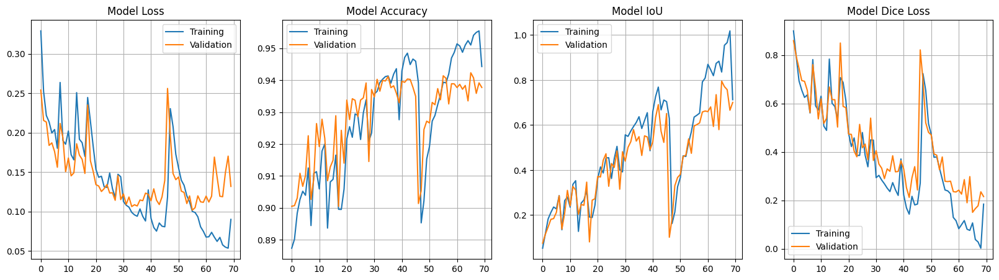

In [ ]:
plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.title("Model Loss")
plt.plot(history.history['loss'], label="Training")
plt.plot(history.history['val_loss'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,2)
plt.title("Model Accuracy")
plt.plot(history.history['accuracy'], label="Training")
plt.plot(history.history['val_accuracy'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,3)
plt.title("Model IoU")
plt.plot(history.history['iou'], label="Training")
plt.plot(history.history['val_iou'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,4)
plt.title("Model Dice Loss")
plt.plot(history.history['dice_loss'], label="Training")
plt.plot(history.history['val_dice_loss'], label="Validation")
plt.legend()
plt.grid()

plt.show()

### Predictions

In [ ]:
unet_model = load_model('./unet_70_v3.h5',custom_objects={'dice_loss': dice_loss,"iou":iou})

In [ ]:
mask_pred = unet_model.predict(scan_test)

3/3 [==============================] - 5s 57ms/step


In [ ]:
print(mask_pred.shape)

(65, 128, 128, 1)


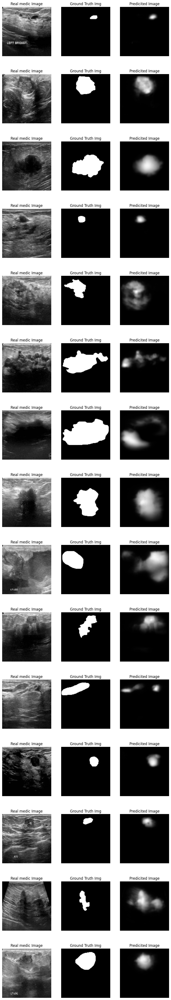

In [ ]:
plt.figure(figsize = (10,60))

i = 0
x = 0
while i < 45 :

    plt.subplot(15,3,i+1)
    plt.imshow(scan_test[x], 'gray')
    plt.title('Real medic Image')
    plt.axis('off')

    plt.subplot(15,3,i+2)
    plt.imshow(mask_test[x], 'gray')
    plt.title('Ground Truth Img')
    plt.axis('off')

    plt.subplot(15,3,i+3)
    plt.imshow(mask_pred[x], 'gray')
    plt.title('Predicited Image')
    plt.axis('off')

    x += 1
    i += 3
plt.show()

## **Attention UNet**

### Building the model

ENCODER

In [ ]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

DECODER

In [ ]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

ATTENTION GATE

In [ ]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

CALLBACKS

In [ ]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

In [ ]:
class ShowProgress(Callback):
    def on_epoch_end(self, epochs, logs=None):
        id = np.random.randint(200)
        exp = GradCAM()
        image = scan[id]
        m = mask[id]
        pred_mask = self.model.predict(image[np.newaxis,...])
        cam = exp.explain(
            validation_data=(image[np.newaxis,...], m),
            class_index=1,
            layer_name='Attention4',
            model=self.model
        )

        plt.figure(figsize=(10,5))

        plt.subplot(1,3,1)
        plt.title("Original Mask")
        show_mask(image, m, cmap='copper')

        plt.subplot(1,3,2)
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='copper')

        plt.subplot(1,3,3)
        show_image(cam,title="GradCAM")

        plt.tight_layout()
        plt.show()

In [ ]:
# Inputs
input_layer = Input(shape=scan.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32,0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64,0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128,0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256,0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512,0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder

a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256,0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128,0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64,0.1, name="Decoder3")([d2, a3])


a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

In [ ]:
att_model = Model(
    inputs=[input_layer],
    outputs=[output_layer]
)

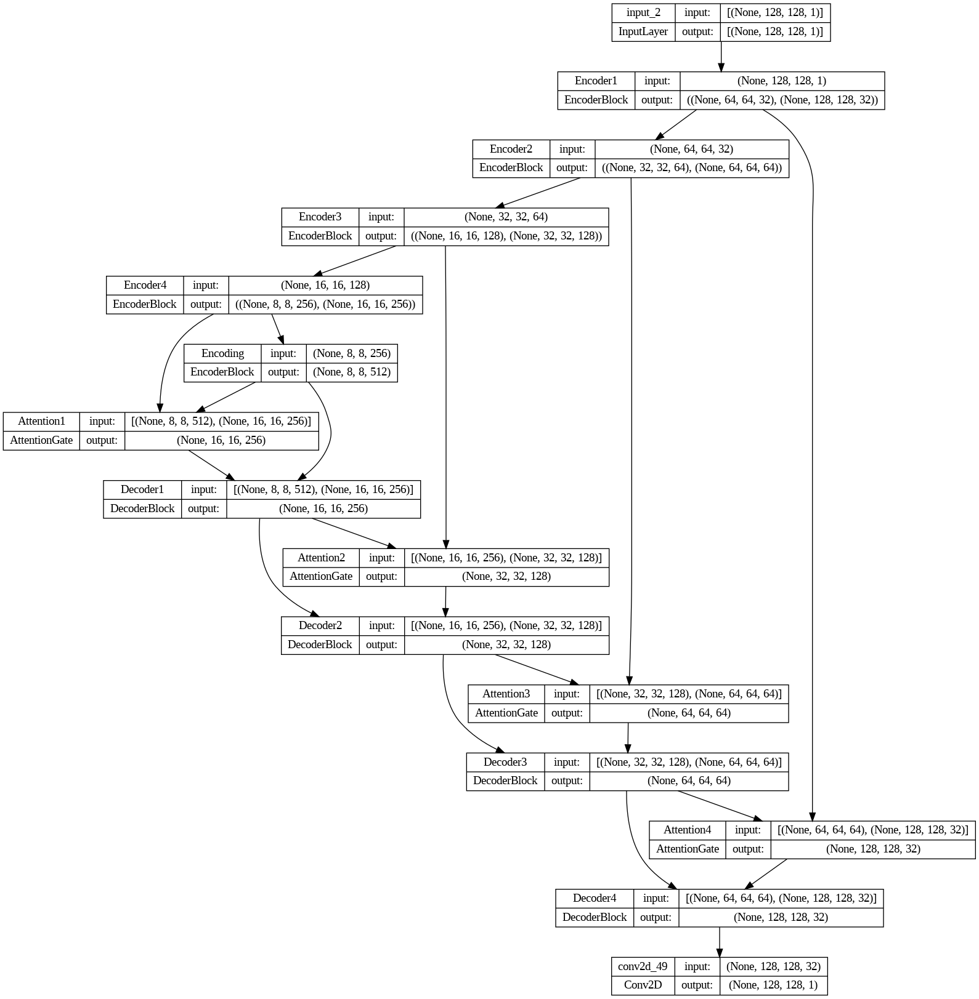

In [ ]:
keras.utils.plot_model(att_model, './attunet_plot.png', show_shapes = True)

### Training

In [ ]:
att_model.compile(
    loss='binary_crossentropy',
    optimizer = keras.optimizers.Adam(learning_rate = 0.00005),
    metrics=['accuracy', iou,dice_loss]
)

In [ ]:
# Callbacks
cb = [
    # EarlyStopping(patience=3, restore_best_weight=True),
    ModelCheckpoint("AttentionUNet_30_v4.h5", save_best_only=True),
]

In [ ]:
BATCH_SIZE = 8
SPE = len(scan_train)//BATCH_SIZE
history = att_model.fit(scan_train, mask_train, epochs = 50, batch_size = BATCH_SIZE,
                    steps_per_epoch=SPE, validation_data = (scan_test, mask_test), callbacks = cb)

Epoch 1/50
72/72 [==============================] - 31s 105ms/step - loss: 0.2869 - accuracy: 0.8853 - iou: 0.1112 - dice_loss: 0.8037 - val_loss: 0.3740 - val_accuracy: 0.9065 - val_iou: 0.1030 - val_dice_loss: 0.8151
Epoch 2/50
72/72 [==============================] - 6s 87ms/step - loss: 0.2251 - accuracy: 0.8998 - iou: 0.1939 - dice_loss: 0.6780 - val_loss: 0.2458 - val_accuracy: 0.9091 - val_iou: 0.1277 - val_dice_loss: 0.7752
Epoch 3/50
72/72 [==============================] - 6s 85ms/step - loss: 0.1922 - accuracy: 0.9105 - iou: 0.2585 - dice_loss: 0.5942 - val_loss: 0.2129 - val_accuracy: 0.9114 - val_iou: 0.1509 - val_dice_loss: 0.7393
Epoch 4/50
72/72 [==============================] - 6s 90ms/step - loss: 0.1862 - accuracy: 0.9129 - iou: 0.2856 - dice_loss: 0.5627 - val_loss: 0.1979 - val_accuracy: 0.9084 - val_iou: 0.1557 - val_dice_loss: 0.7318
Epoch 5/50
72/72 [==============================] - 6s 89ms/step - loss: 0.1818 - accuracy: 0.9143 - iou: 0.3092 - dice_loss: 0.53

### Model Performence

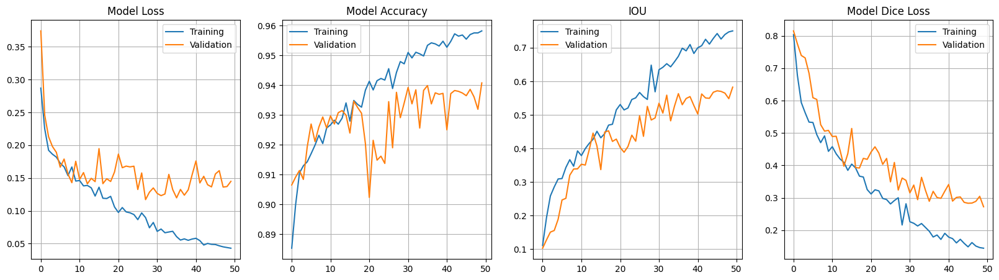

In [ ]:
plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.title("Model Loss")
plt.plot(history.history['loss'], label="Training")
plt.plot(history.history['val_loss'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,2)
plt.title("Model Accuracy")
plt.plot(history.history['accuracy'], label="Training")
plt.plot(history.history['val_accuracy'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,3)
plt.title("IOU")
plt.plot(history.history['iou'], label="Training")
plt.plot(history.history['val_iou'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,4)
plt.title("Model Dice Loss")
plt.plot(history.history['dice_loss'], label="Training")
plt.plot(history.history['val_dice_loss'], label="Validation")
plt.legend()
plt.grid()

plt.show()

### Predictions

In [ ]:
mask_pred = att_model.predict(scan_test)

3/3 [==============================] - 3s 29ms/step


1/1 [==============================] - 0s 21ms/step


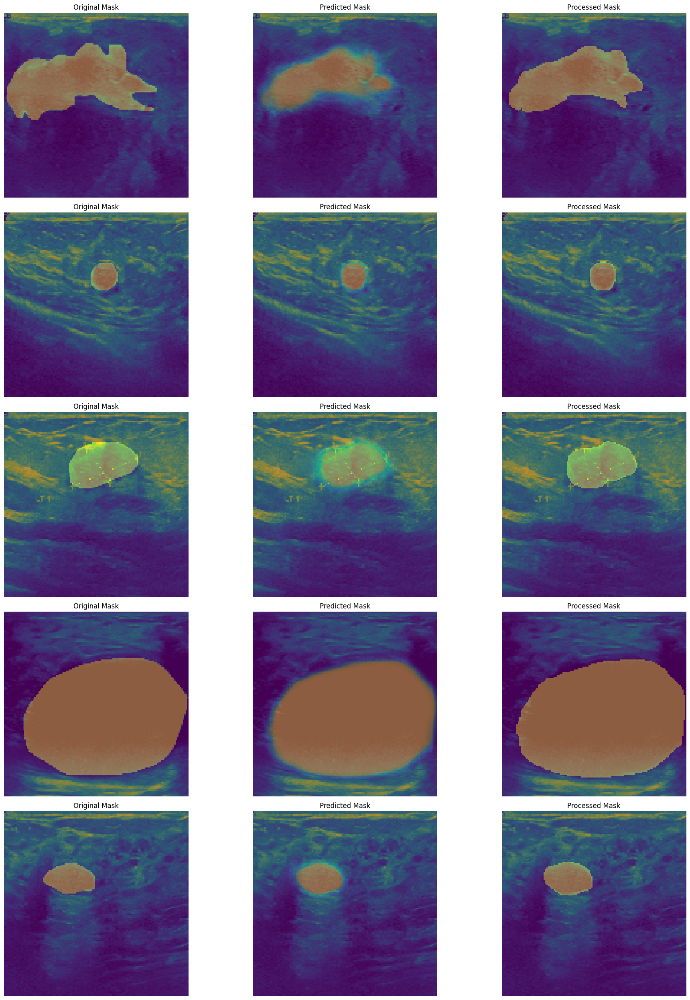

In [ ]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(scan))
        image = scan[id]
        m = mask[id]
        pred_mask = att_model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, m)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()

## **Residual Unet**

### Building the model

Different Blocks

In [ ]:
def bn_act(x, act=True):
    x = keras.layers.BatchNormalization()(x)
    if act == True:
        x = keras.layers.Activation("relu")(x)
    return x

def conv_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = bn_act(x)
    conv = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides)(conv)
    return conv

def stem(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = keras.layers.Conv2D(filters, kernel_size, padding=padding, strides=strides)(x)
    conv = conv_block(conv, filters, kernel_size=kernel_size, padding=padding, strides=strides)

    shortcut = keras.layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = bn_act(shortcut, act=False)

    output = keras.layers.Add()([conv, shortcut])
    return output

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    res = conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)

    shortcut = keras.layers.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = bn_act(shortcut, act=False)

    output = keras.layers.Add()([shortcut, res])
    return output

def upsample_concat_block(x, xskip):
    u = keras.layers.UpSampling2D((2, 2))(x)
    c = keras.layers.Concatenate()([u, xskip])
    return c


In [ ]:
def ResUNet():
    f = [16, 32, 64, 128, 256]
    inputs = keras.layers.Input((128, 128, 1))

    ## Encoder
    e0 = inputs
    e1 = stem(e0, f[0])
    e2 = residual_block(e1, f[1], strides=2)
    e3 = residual_block(e2, f[2], strides=2)
    e4 = residual_block(e3, f[3], strides=2)
    e5 = residual_block(e4, f[4], strides=2)

    ## Bridge
    b0 = conv_block(e5, f[4], strides=1)
    b1 = conv_block(b0, f[4], strides=1)

    ## Decoder
    u1 = upsample_concat_block(b1, e4)
    d1 = residual_block(u1, f[4])

    u2 = upsample_concat_block(d1, e3)
    d2 = residual_block(u2, f[3])

    u3 = upsample_concat_block(d2, e2)
    d3 = residual_block(u3, f[2])

    u4 = upsample_concat_block(d3, e1)
    d4 = residual_block(u4, f[1])

    outputs = keras.layers.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = keras.models.Model(inputs, outputs)
    return model

In [ ]:
res_unet_model = ResUNet()
adam = keras.optimizers.Adam()
res_unet_model.compile(optimizer=adam, loss=BinaryCrossentropy(), metrics=['accuracy',dice_loss,iou])
res_unet_model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 conv2d_50 (Conv2D)          (None, 128, 128, 16)         160       ['input_3[0][0]']             
                                                                                                  
 batch_normalization_4 (Bat  (None, 128, 128, 16)         64        ['conv2d_50[0][0]']           
 chNormalization)                                                                                 
                                                                                                  
 activation (Activation)     (None, 128, 128, 16)         0         ['batch_normalization_4[

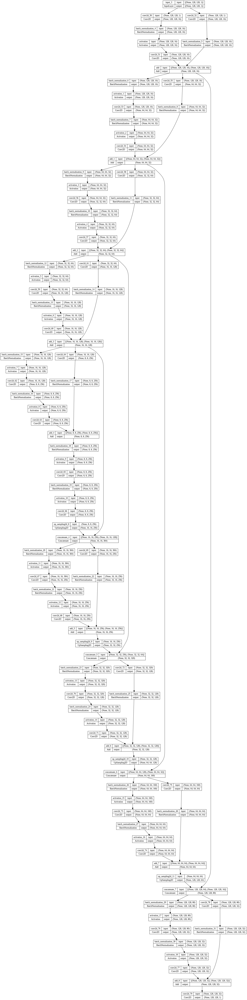

In [ ]:
keras.utils.plot_model(res_unet_model, './resunet_model_plot.png', show_shapes = True)

### Training

In [ ]:
checkp = ModelCheckpoint('./resunet_60_v3.h5',save_best_only = True, verbose = 1)

In [ ]:
scan_train.shape

(579, 128, 128, 1)

In [ ]:
history = res_unet_model.fit(scan_train, mask_train, epochs = 60,
                         batch_size = 8, validation_data = (scan_test, mask_test), callbacks = [checkp])

Epoch 1/60
73/73 [==============================] - ETA: 0s - loss: 0.2343 - accuracy: 0.8944 - dice_loss: 0.6363 - iou: 0.2269
Epoch 1: val_loss improved from inf to 1.50301, saving model to ./resunet_60_v3.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


73/73 [==============================] - 43s 129ms/step - loss: 0.2343 - accuracy: 0.8944 - dice_loss: 0.6363 - iou: 0.2269 - val_loss: 1.5030 - val_accuracy: 0.4595 - val_dice_loss: 0.7876 - val_iou: 0.1214
Epoch 2/60
72/73 [============================>.] - ETA: 0s - loss: 0.1902 - accuracy: 0.9081 - dice_loss: 0.5597 - iou: 0.2870
Epoch 2: val_loss improved from 1.50301 to 0.58558, saving model to ./resunet_60_v3.h5
73/73 [==============================] - 5s 66ms/step - loss: 0.1898 - accuracy: 0.9084 - dice_loss: 0.5640 - iou: 0.2841 - val_loss: 0.5856 - val_accuracy: 0.7099 - val_dice_loss: 0.7078 - val_iou: 0.1735
Epoch 3/60
72/73 [============================>.] - ETA: 0s - loss: 0.1749 - accuracy: 0.9157 - dice_loss: 0.5220 - iou: 0.3175
Epoch 3: val_loss improved from 0.58558 to 0.25449, saving model to ./resunet_60_v3.h5
73/73 [==============================] - 5s 69ms/step - loss: 0.1747 - accuracy: 0.9158 - dice_loss: 0.5212 - iou: 0.3182 - val_loss: 0.2545 - val_accuracy:

### Model performence

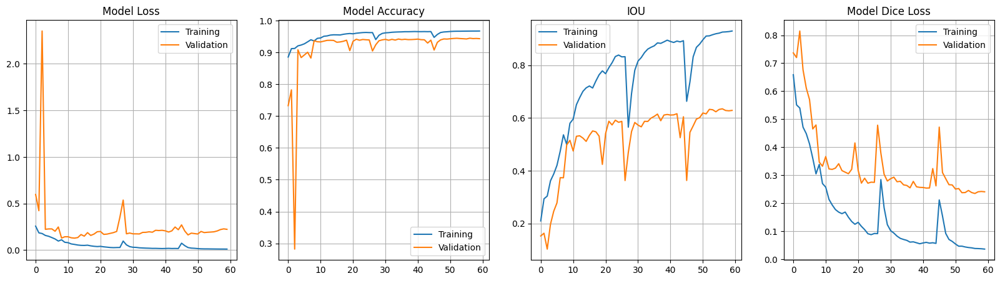

In [ ]:
plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.title("Model Loss")
plt.plot(history.history['loss'], label="Training")
plt.plot(history.history['val_loss'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,2)
plt.title("Model Accuracy")
plt.plot(history.history['accuracy'], label="Training")
plt.plot(history.history['val_accuracy'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,3)
plt.title("IOU")
plt.plot(history.history['iou'], label="Training")
plt.plot(history.history['val_iou'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,4)
plt.title("Model Dice Loss")
plt.plot(history.history['dice_loss'], label="Training")
plt.plot(history.history['val_dice_loss'], label="Validation")
plt.legend()
plt.grid()

plt.show()

### Predictions

In [ ]:
res_unet_model = load_model('./resunet_60_v2.h5',custom_objects={'dice_loss': dice_loss,"iou":iou})

In [ ]:
res_unet_pred = res_unet_model.predict(scan_test)

3/3 [==============================] - 5s 33ms/step


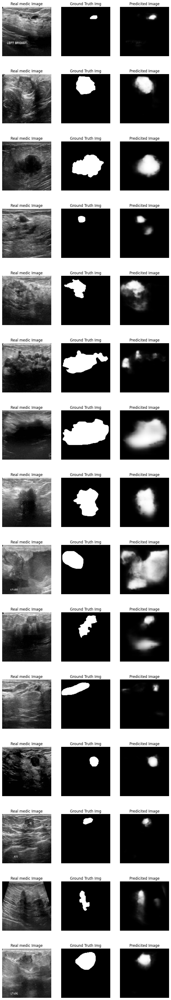

In [ ]:
plt.figure(figsize = (10,60))

i = 0
x = 0
while i < 45 :

    plt.subplot(15,3,i+1)
    plt.imshow(scan_test[x], 'gray')
    plt.title('Real medic Image')
    plt.axis('off')

    plt.subplot(15,3,i+2)
    plt.imshow(mask_test[x], 'gray')
    plt.title('Ground Truth Img')
    plt.axis('off')

    plt.subplot(15,3,i+3)
    plt.imshow(res_unet_pred[x], 'gray')
    plt.title('Predicited Image')
    plt.axis('off')

    x += 1
    i += 3
plt.show()

## **SegNet**

### Building the model

https://github.com/kulkarnikeerti/SegNet-Semantic-Segmentation/blob/master/SegNet_Model.ipynb

In [ ]:
class MaxPoolingWithArgmax2D(Layer):
    def __init__(
            self,
            pool_size=(2, 2),
            strides=(2, 2),
            padding='same',
            **kwargs):
        super(MaxPoolingWithArgmax2D, self).__init__(**kwargs)
        self.padding = padding
        self.pool_size = pool_size
        self.strides = strides

    def call(self, inputs, **kwargs):
        padding = self.padding
        pool_size = self.pool_size
        strides = self.strides
        ksize = [1, pool_size[0], pool_size[1], 1]
        padding = padding.upper()
        strides = [1, strides[0], strides[1], 1]
        output, argmax = tf.nn.max_pool_with_argmax(
            inputs,
            ksize=ksize,
            strides=strides,
            padding=padding
        )
        argmax = K.cast(argmax, K.floatx())
        return [output, argmax]

    def compute_output_shape(self, input_shape):
        ratio = (1, 2, 2, 1)
        output_shape = [
            dim // ratio[idx] if dim is not None else None
            for idx, dim in enumerate(input_shape)]
        output_shape = tuple(output_shape)
        return [output_shape, output_shape]

    def compute_mask(self, inputs, mask=None):
        return 2 * [None]

class MaxUnpooling2D(Layer):
    def __init__(self, size=(2, 2), **kwargs):
        super(MaxUnpooling2D, self).__init__(**kwargs)
        self.size = size

    def call(self, inputs, output_shape=None):
        # one is pool and one is mask
        updates, mask = inputs[0], inputs[1]

        mask = K.cast(mask, 'int32')
        input_shape = tf.shape(updates, out_type='int32')
        if output_shape is None:
            output_shape = (
                input_shape[0],
                input_shape[1] * self.size[0],
                input_shape[2] * self.size[1],
                input_shape[3]
            )
        self.output_shape1 = output_shape

        one_like_mask = K.ones_like(mask, dtype='int32')
        batch_shape = K.concatenate([[input_shape[0]], [1], [1], [1]], axis=0)
        batch_range = K.reshape(tf.range(output_shape[0], dtype='int32'), shape=batch_shape)
        b = one_like_mask * batch_range

        y = mask // (output_shape[2] * output_shape[3])
        x = (mask // output_shape[3]) % output_shape[2]
        feature_range = tf.range(output_shape[3], dtype='int32')
        f = one_like_mask * feature_range

        indices = K.transpose(K.reshape(K.stack([b, y, x, f]), [4, -1]))
        values = K.reshape(updates, [-1])
        ret = tf.scatter_nd(indices, values, output_shape)
        return ret

    def compute_output_shape(self, input_shape):
        mask_shape = input_shape[1]
        return (
            mask_shape[0],
            mask_shape[1] * self.size[0],
            mask_shape[2] * self.size[1],
            mask_shape[3]
        )


In [ ]:
def segnet(
        input_shape,
        n_labels,
        kernel=3,
        pool_size=(2, 2),
        output_mode="softmax"):
    # encoder
    inputs = Input(shape=input_shape)

    conv_1 = Conv2D(64, (kernel, kernel), padding="same", kernel_initializer='he_normal', name="block1_conv1")(inputs)
    conv_1 = BatchNormalization()(conv_1)
    conv_1 = Activation("relu")(conv_1)
    conv_2 = Conv2D(64, (kernel, kernel), padding="same", kernel_initializer='he_normal', name="block1_conv2")(conv_1)
    conv_2 = BatchNormalization()(conv_2)
    conv_2 = Activation("relu")(conv_2)
    pool_1, mask_1 = MaxPoolingWithArgmax2D(pool_size, name="block1_pool")(conv_2)

    conv_3 = Conv2D(128, (kernel, kernel), padding="same" , kernel_initializer='he_normal', name="block2_conv1")(pool_1)
    conv_3 = BatchNormalization()(conv_3)
    conv_3 = Activation("relu")(conv_3)
    conv_4 = Conv2D(128, (kernel, kernel), padding="same", kernel_initializer='he_normal',  name="block2_conv2")(conv_3)
    conv_4 = BatchNormalization()(conv_4)
    conv_4 = Activation("relu")(conv_4)

    pool_2, mask_2 = MaxPoolingWithArgmax2D(pool_size, name="block2_pool")(conv_4)

    conv_5 = Conv2D(256, (kernel, kernel), padding="same" , kernel_initializer='he_normal', name="block3_conv1")(pool_2)
    conv_5 = BatchNormalization()(conv_5)
    conv_5 = Activation("relu")(conv_5)
    conv_6 = Conv2D(256, (kernel, kernel), padding="same" , kernel_initializer='he_normal', name="block3_conv2")(conv_5)
    conv_6 = BatchNormalization()(conv_6)
    conv_6 = Activation("relu")(conv_6)
    conv_7 = Conv2D(256, (kernel, kernel), padding="same" , kernel_initializer='he_normal', name="block3_conv3")(conv_6)
    conv_7 = BatchNormalization()(conv_7)
    conv_7 = Activation("relu")(conv_7)

    pool_3, mask_3 = MaxPoolingWithArgmax2D(pool_size, name="block3_pool")(conv_7)

    conv_8 = Conv2D(512, (kernel, kernel), padding="same", kernel_initializer='he_normal', name="block4_conv1")(pool_3)
    conv_8 = BatchNormalization()(conv_8)
    conv_8 = Activation("relu")(conv_8)
    conv_9 = Conv2D(512, (kernel, kernel), padding="same" , kernel_initializer='he_normal', name="block4_conv2")(conv_8)
    conv_9 = BatchNormalization()(conv_9)
    conv_9 = Activation("relu")(conv_9)
    conv_10 = Conv2D(512, (kernel, kernel), padding="same" , kernel_initializer='he_normal', name="block4_conv3")(conv_9)
    conv_10 = BatchNormalization()(conv_10)
    conv_10 = Activation("relu")(conv_10)

    pool_4, mask_4 = MaxPoolingWithArgmax2D(pool_size, name="block4_pool")(conv_10)

    conv_11 = Conv2D(512, (kernel, kernel), padding="same", kernel_initializer='he_normal', name="block5_conv1")(pool_4)
    conv_11 = BatchNormalization()(conv_11)
    conv_11 = Activation("relu")(conv_11)
    conv_12 = Conv2D(512, (kernel, kernel), padding="same" , kernel_initializer='he_normal',  name="block5_conv2")(conv_11)
    conv_12 = BatchNormalization()(conv_12)
    conv_12 = Activation("relu")(conv_12)
    conv_13 = Conv2D(512, (kernel, kernel), padding="same" , kernel_initializer='he_normal',  name="block5_conv3")(conv_12)
    conv_13 = BatchNormalization()(conv_13)
    conv_13 = Activation("relu")(conv_13)

    pool_5, mask_5 = MaxPoolingWithArgmax2D(pool_size, name="block5_pool")(conv_13)

    # decoder
    unpool_1 = MaxUnpooling2D(pool_size)([pool_5, mask_5])

    conv_14 = Conv2D(512, (kernel, kernel), padding="same", kernel_initializer='he_normal')(unpool_1)
    conv_14 = BatchNormalization()(conv_14)
    conv_14 = Activation("relu")(conv_14)
    conv_15 = Conv2D(512, (kernel, kernel), padding="same", kernel_initializer='he_normal')(conv_14)
    conv_15 = BatchNormalization()(conv_15)
    conv_15 = Activation("relu")(conv_15)
    conv_16 = Conv2D(512, (kernel, kernel), padding="same", kernel_initializer='he_normal')(conv_15)
    conv_16 = BatchNormalization()(conv_16)
    conv_16 = Activation("relu")(conv_16)

    unpool_2 = MaxUnpooling2D(pool_size)([conv_16, mask_4])

    conv_17 = Conv2D(512, (kernel, kernel), padding="same", kernel_initializer='he_normal')(unpool_2)
    conv_17 = BatchNormalization()(conv_17)
    conv_17 = Activation("relu")(conv_17)
    conv_18 = Conv2D(512, (kernel, kernel), padding="same", kernel_initializer='he_normal')(conv_17)
    conv_18 = BatchNormalization()(conv_18)
    conv_18 = Activation("relu")(conv_18)
    conv_19 = Conv2D(256, (kernel, kernel), padding="same", kernel_initializer='he_normal')(conv_18)
    conv_19 = BatchNormalization()(conv_19)
    conv_19 = Activation("relu")(conv_19)

    unpool_3 = MaxUnpooling2D(pool_size)([conv_19, mask_3])

    conv_20 = Conv2D(256, (kernel, kernel), padding="same", kernel_initializer='he_normal')(unpool_3)
    conv_20 = BatchNormalization()(conv_20)
    conv_20 = Activation("relu")(conv_20)
    conv_21 = Conv2D(256, (kernel, kernel), padding="same", kernel_initializer='he_normal')(conv_20)
    conv_21 = BatchNormalization()(conv_21)
    conv_21 = Activation("relu")(conv_21)
    conv_22 = Conv2D(128, (kernel, kernel), padding="same", kernel_initializer='he_normal')(conv_21)
    conv_22 = BatchNormalization()(conv_22)
    conv_22 = Activation("relu")(conv_22)

    unpool_4 = MaxUnpooling2D(pool_size)([conv_22, mask_2])

    conv_23 = Conv2D(128, (kernel, kernel), padding="same", kernel_initializer='he_normal')(unpool_4)
    conv_23 = BatchNormalization()(conv_23)
    conv_23 = Activation("relu")(conv_23)
    conv_24 = Conv2D(64, (kernel, kernel), padding="same", kernel_initializer='he_normal')(conv_23)
    conv_24 = BatchNormalization()(conv_24)
    conv_24 = Activation("relu")(conv_24)

    unpool_5 = MaxUnpooling2D(pool_size)([conv_24, mask_1])

    conv_25 = Conv2D(64, (kernel, kernel), padding="same", kernel_initializer='he_normal')(unpool_5)
    conv_25 = BatchNormalization()(conv_25)
    conv_25 = Activation("relu")(conv_25)

    conv_26 = Conv2D(1, (1, 1), padding="same", kernel_initializer='he_normal')(conv_25)
    conv_26 = BatchNormalization()(conv_26)
    outputs = Activation("sigmoid")(conv_26)

    model = Model(inputs=inputs, outputs=outputs, name="SegNet")

    return model

In [ ]:
seg_model= segnet(input_shape=(128,128,1), n_labels=2)

In [ ]:
seg_model.summary()

Model: "SegNet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 128, 128, 1)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 128, 128, 64)         640       ['input_4[0][0]']             
                                                                                                  
 batch_normalization_32 (Ba  (None, 128, 128, 64)         256       ['block1_conv1[0][0]']        
 tchNormalization)                                                                                
                                                                                                  
 activation_19 (Activation)  (None, 128, 128, 64)         0         ['batch_normalization_32[

In [ ]:
#sgd = tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.9)
seg_model.compile(loss="binary_crossentropy", optimizer='adam', metrics=['acc',iou,dice_loss])

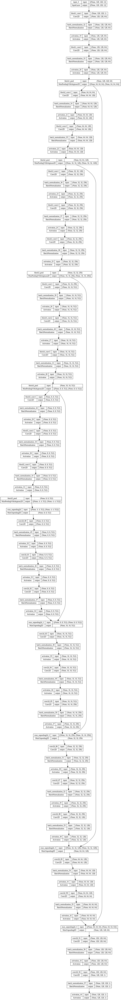

In [ ]:
keras.utils.plot_model(seg_model, './segnet_model_plot.png', show_shapes = True)

### Training

In [ ]:
checkp = ModelCheckpoint('./segnet_200_v3.h5',save_best_only = True, verbose = 1)

In [ ]:
history =seg_model.fit(scan_train, mask_train, epochs = 200,
                         batch_size = 8, validation_data = (scan_test, mask_test), callbacks = [checkp])

Epoch 1/200
73/73 [==============================] - ETA: 0s - loss: 0.6811 - acc: 0.8228 - iou: 0.0994 - dice_loss: 0.8204
Epoch 1: val_loss improved from inf to 143.64423, saving model to ./segnet_200_v3.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


73/73 [==============================] - 57s 315ms/step - loss: 0.6811 - acc: 0.8228 - iou: 0.0994 - dice_loss: 0.8204 - val_loss: 143.6442 - val_acc: 0.4757 - val_iou: 0.0888 - val_dice_loss: 0.8392
Epoch 2/200
73/73 [==============================] - ETA: 0s - loss: 0.5961 - acc: 0.8428 - iou: 0.1247 - dice_loss: 0.7812
Epoch 2: val_loss improved from 143.64423 to 6.32681, saving model to ./segnet_200_v3.h5
73/73 [==============================] - 20s 277ms/step - loss: 0.5961 - acc: 0.8428 - iou: 0.1247 - dice_loss: 0.7812 - val_loss: 6.3268 - val_acc: 0.4147 - val_iou: 0.1051 - val_dice_loss: 0.8123
Epoch 3/200
73/73 [==============================] - ETA: 0s - loss: 0.5492 - acc: 0.8669 - iou: 0.1363 - dice_loss: 0.7629
Epoch 3: val_loss improved from 6.32681 to 1.45392, saving model to ./segnet_200_v3.h5
73/73 [==============================] - 20s 275ms/step - loss: 0.5492 - acc: 0.8669 - iou: 0.1363 - dice_loss: 0.7629 - val_loss: 1.4539 - val_acc: 0.6813 - val_iou: 0.1258 - va

### Model Performence

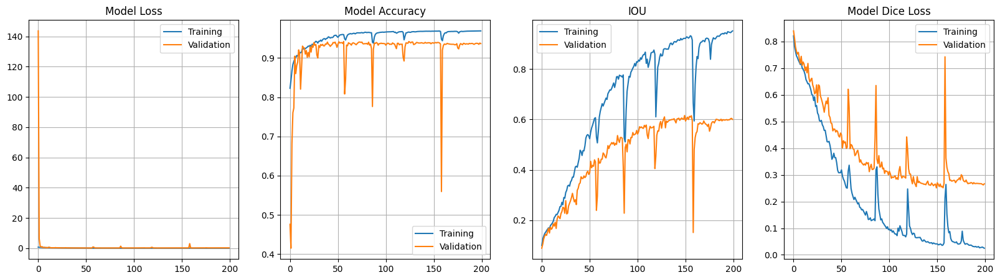

In [ ]:
plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.title("Model Loss")
plt.plot(history.history['loss'], label="Training")
plt.plot(history.history['val_loss'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,2)
plt.title("Model Accuracy")
plt.plot(history.history['acc'], label="Training")
plt.plot(history.history['val_acc'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,3)
plt.title("IOU")
plt.plot(history.history['iou'], label="Training")
plt.plot(history.history['val_iou'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,4)
plt.title("Model Dice Loss")
plt.plot(history.history['dice_loss'], label="Training")
plt.plot(history.history['val_dice_loss'], label="Validation")
plt.legend()
plt.grid()

plt.show()

### Prediction

In [ ]:
segnet_pred = seg_model.predict(scan_test)

3/3 [==============================] - 4s 250ms/step


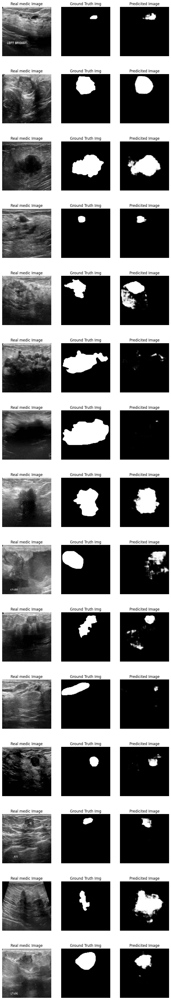

In [ ]:
plt.figure(figsize = (10,60))

i = 0
x = 0
while i < 45 :

    plt.subplot(15,3,i+1)
    plt.imshow(scan_test[x], 'gray')
    plt.title('Real medic Image')
    plt.axis('off')

    plt.subplot(15,3,i+2)
    plt.imshow(mask_test[x], 'gray')
    plt.title('Ground Truth Img')
    plt.axis('off')

    plt.subplot(15,3,i+3)
    plt.imshow(segnet_pred[x], 'gray')
    plt.title('Predicited Image')
    plt.axis('off')

    x += 1
    i += 3
plt.show()

## DeepLab

### Building the model

In [ ]:
def greytocolor(img):
  colored_img = img.repeat(3,axis = -1)
  return colored_img

In [ ]:
colored_scan_train = []
for i in range(len(scan_train)):
    colored_img = greytocolor(scan_train[i])
    colored_scan_train.append(colored_img)
colored_scan_train = np.array(colored_scan_train)

In [ ]:
colored_scan_test = []
for i in range(len(scan_test)):
    colored_img = greytocolor(scan_test[i])
    colored_scan_test.append(colored_img)
colored_scan_test = np.array(colored_scan_test)

In [ ]:
class ConvBlock(Layer):

    def __init__(self, filters=256, kernel_size=3, use_bias=False, dilation_rate=1, **kwargs):
        super(ConvBlock, self).__init__(**kwargs)

        self.filters = filters
        self.kernel_size = kernel_size
        self.use_bias = use_bias
        self.dilation_rate = dilation_rate

        self.net = Sequential([
            Conv2D(filters, kernel_size=kernel_size, strides=1, padding='same', dilation_rate=dilation_rate, use_bias=use_bias, kernel_initializer='he_normal'),
            BatchNormalization(),
            ReLU()
        ])

    def call(self, X): return self.net(X)

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "kernel_size":self.kernel_size,
            "use_bias":self.use_bias,
            "dilation_rate":self.dilation_rate
        }

In [ ]:
def AtrousSpatialPyramidPooling(X):

    # Shapes
    _, height, width, _ = X.shape

    # Image Pooling
    image_pool = AveragePooling2D(pool_size=(height, width), name="ASPP-AvgPool2D")(X)
    image_pool = ConvBlock(kernel_size=1, name="ASPP-ConvBlock-1")(image_pool)
    image_pool = UpSampling2D(size=(height//image_pool.shape[1], width//image_pool.shape[2]), name="ASPP-UpSampling")(image_pool)

    # Conv Blocks
    conv_1 = ConvBlock(kernel_size=1, dilation_rate=1, name="ASPP-Conv-1")(X)
    conv_6 = ConvBlock(kernel_size=3, dilation_rate=6, name="ASPP-Conv-6")(X)
    conv_12 = ConvBlock(kernel_size=3, dilation_rate=12, name="ASPP-Conv-12")(X)
    conv_18 = ConvBlock(kernel_size=3, dilation_rate=18, name="ASPP-Conv-18")(X)

    # Concat All
    concat = Concatenate(axis=-1, name="ASPP-Concat")([image_pool, conv_1, conv_6, conv_12, conv_18])
    net = ConvBlock(kernel_size=1, name="ASPP-Net")(concat)

    return net

In [ ]:
LR = 1e-3
IMAGE_SIZE = 128

# Input
InputL = Input(shape=(128, 128, 3), name="InputLayer")

# Base Mode
resnet50 = ResNet50(include_top=False, weights='imagenet', input_tensor=InputL)

# ASPP Phase
DCNN = resnet50.get_layer('conv4_block6_2_relu').output
ASPP = AtrousSpatialPyramidPooling(DCNN)
ASPP = UpSampling2D(size=(IMAGE_SIZE//4//ASPP.shape[1], IMAGE_SIZE//4//ASPP.shape[2]), name="AtrousSpatial")(ASPP)

# LLF Phase
LLF = resnet50.get_layer('conv2_block3_2_relu').output
LLF = ConvBlock(filters=48, kernel_size=1, name="LLF-ConvBlock")(LLF)

# Combined
combined = Concatenate(axis=-1, name="Combine-LLF-ASPP")([ASPP, LLF])
features = ConvBlock(name="Top-ConvBlock-1")(combined)
features = ConvBlock(name="Top-ConvBlock-2")(features)
upsample = UpSampling2D(size=(IMAGE_SIZE//features.shape[1], IMAGE_SIZE//features.shape[1]), interpolation='bilinear', name="Top-UpSample")(features)

# Output Mask
PredMask = Conv2D(1, kernel_size=3, strides=1, padding='same', activation='sigmoid', use_bias=False, name="OutputMask")(upsample)

# DeelLabV3+ Model
model = Model(InputL, PredMask, name="DeepLabV3-Plus")
model.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "DeepLabV3-Plus"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 InputLayer (InputLayer)     [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 134, 134, 3)          0         ['InputLayer[0][0]']          
                                                                                                  
 conv1_conv (Conv2D)         (None, 64, 64, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 64, 64, 64)           256       ['conv1_conv[0][0]']          
 on)                

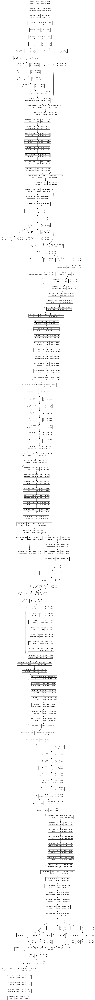

In [ ]:
plot_model(model, "DeepLabV3+.png", show_shapes=True, dpi=96)

### Training

In [ ]:
optimizer = tf.keras.optimizers.Adam(learning_rate=LR)
model.compile(loss='binary_crossentropy', optimizer=optimizer,metrics=['accuracy',dice_loss,iou])

# Callbacks
callbacks = [ModelCheckpoint("DeepLab_100.h5")]

# Training
history = model.fit(colored_scan_train,mask_train, validation_data = (colored_scan_test, mask_test),
          epochs=100, callbacks=callbacks)

Epoch 1/100
19/19 [==============================] - 50s 589ms/step - loss: 0.2457 - accuracy: 0.8689 - dice_loss: 0.5511 - iou: 0.2998 - val_loss: 0.4959 - val_accuracy: 0.7347 - val_dice_loss: 0.7931 - val_iou: 0.1205
Epoch 2/100
19/19 [==============================] - 5s 269ms/step - loss: 0.1242 - accuracy: 0.9282 - dice_loss: 0.3799 - iou: 0.4521 - val_loss: 0.2839 - val_accuracy: 0.8754 - val_dice_loss: 0.8457 - val_iou: 0.0872
Epoch 3/100
19/19 [==============================] - 5s 273ms/step - loss: 0.0928 - accuracy: 0.9426 - dice_loss: 0.2848 - iou: 0.5581 - val_loss: 0.2492 - val_accuracy: 0.8989 - val_dice_loss: 0.8477 - val_iou: 0.0857
Epoch 4/100
19/19 [==============================] - 5s 276ms/step - loss: 0.0714 - accuracy: 0.9489 - dice_loss: 0.2452 - iou: 0.6130 - val_loss: 0.2729 - val_accuracy: 0.8621 - val_dice_loss: 0.8265 - val_iou: 0.0985
Epoch 5/100
19/19 [==============================] - 5s 272ms/step - loss: 0.0794 - accuracy: 0.9452 - dice_loss: 0.2632 - 

### Model Performence

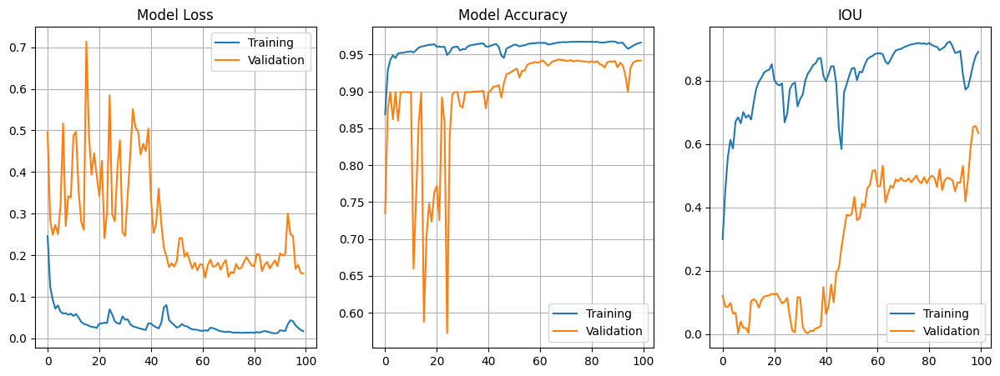

In [ ]:
plt.figure(figsize=(20,5))

plt.subplot(1,4,1)
plt.title("Model Loss")
plt.plot(history.history['loss'], label="Training")
plt.plot(history.history['val_loss'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,2)
plt.title("Model Accuracy")
plt.plot(history.history['accuracy'], label="Training")
plt.plot(history.history['val_accuracy'], label="Validation")
plt.legend()
plt.grid()

plt.subplot(1,4,3)
plt.title("IOU")
plt.plot(history.history['iou'], label="Training")
plt.plot(history.history['val_iou'], label="Validation")
plt.legend()
plt.grid()

### Prediction

In [ ]:
deep3_pred = model.predict(colored_scan_test)

3/3 [==============================] - 2s 93ms/step


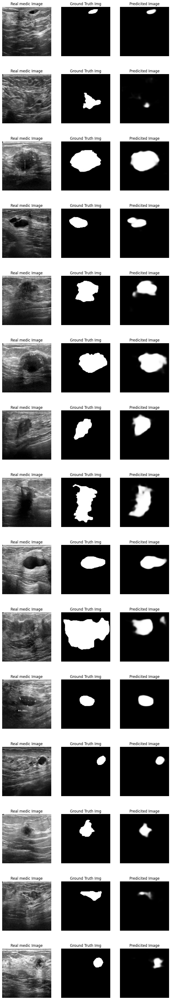

In [ ]:
plt.figure(figsize = (10,60))

i = 0
x = 0
while i < 45 :

    plt.subplot(15,3,i+1)
    plt.imshow(scan_test[x], 'gray')
    plt.title('Real medic Image')
    plt.axis('off')

    plt.subplot(15,3,i+2)
    plt.imshow(mask_test[x], 'gray')
    plt.title('Ground Truth Img')
    plt.axis('off')

    plt.subplot(15,3,i+3)
    plt.imshow(deep3_pred[x], 'gray')
    plt.title('Predicited Image')
    plt.axis('off')

    x += 1
    i += 3
plt.show()

# Trying ensemble

## Loading the models

In [ ]:
unet = load_model('/content/drive/MyDrive/breast cancer models/unet_70_v3.h5',
                  custom_objects={'dice_loss': dice_loss,"iou":iou})
#unet_70_v3 performing better

In [ ]:
unet_pred = unet.predict(scan_test)

3/3 [==============================] - 13s 457ms/step


In [ ]:
att_unet = load_model('/content/drive/MyDrive/breast cancer models/AttentionUNet_30.h5',
                      custom_objects={'dice_loss': dice_loss,"iou":iou,
                                      'EncoderBlock': EncoderBlock,'AttentionGate': AttentionGate,
                                      'DecoderBlock':DecoderBlock
                                      })
#v1 better iou here but v4 better training

In [ ]:
att_pred = att_unet.predict(scan_test)

3/3 [==============================] - 4s 456ms/step


In [ ]:
att_pred.shape

(65, 128, 128, 1)

In [ ]:
res_unet = load_model('/content/drive/MyDrive/breast cancer models/resunet_60_v3.h5',custom_objects={'dice_loss': dice_loss,"iou":iou})

In [ ]:
res_unet_pred = res_unet.predict(scan_test)

3/3 [==============================] - 4s 375ms/step


In [ ]:

custom_objects = {
    'MaxPoolingWithArgmax2D': MaxPoolingWithArgmax2D,
    'MaxUnpooling2D': MaxUnpooling2D,
    'dice_loss': dice_loss,
    'iou': iou
}

seg_net = load_model('/content/drive/MyDrive/breast cancer models/segnet_200_v3.h5', custom_objects=custom_objects)


In [ ]:
seg_net_pred = seg_net.predict(scan_test)

3/3 [==============================] - 5s 539ms/step


In [ ]:
def greytocolor(img):
  colored_img = img.repeat(3,axis = -1)
  return colored_img

In [ ]:
colored_scan_test = []
for i in range(len(scan_test)):
    colored_img = greytocolor(scan_test[i])
    colored_scan_test.append(colored_img)
colored_scan_test = np.array(colored_scan_test)

In [ ]:
deep3_model = load_model('/content/drive/MyDrive/breast cancer models/DeepLab_100.h5',
                         custom_objects = {'ConvBlock' :ConvBlock,
                                           'AtrousSpatialPyramidPooling':AtrousSpatialPyramidPooling,
                                           'dice_loss': dice_loss,
                                          'iou': iou
                                           })

In [ ]:
deep3_pred = deep3_model.predict(colored_scan_test)

3/3 [==============================] - 4s 275ms/step


## Evaluation Metrics

In [ ]:
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])

    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f)

    # Check if both masks are empty (union is 0)
    if union == 0:
        score = 1.0  # Dice coefficient smoothing for empty masks
    else:
        score = (2. * intersection + smooth) / (union + smooth)

    return score

In [ ]:
def iou(true_mask,predicted_mask):
    intersection = np.sum(predicted_mask * true_mask)
    union = np.sum(predicted_mask) + np.sum(true_mask) - intersection

    if union == 0:
        iou = 1.0  # IoU smoothing
    else:
        iou = intersection / union

    return iou

## Calculating iou and dice loss for each individual model

### Deep3 Lab

In [ ]:
iou_scores = []
dice_scores = []

for i in range(len(scan_test)):
    iou_value = iou(deep3_pred[i],mask_test[i])

    dice = dice_coeff(deep3_pred[i],mask_test[i])
    iou_scores.append(iou_value)
    dice_scores.append(dice)

mean_iou_deep3 = np.nanmean(iou_scores)
mean_dice_deep3 = np.mean(dice_scores)

print(f"Mean IoU: {mean_iou_deep3}")
print(f"Mean Dice Coefiicient: {mean_dice_deep3}")

Mean IoU: 0.829233651685735
Mean Dice Coefiicient: 0.9006853103637695


### Res_unet

In [ ]:
iou_scores = []
dice_scores = []

for i in range(len(scan_test)):
    iou_value = iou(res_unet_pred[i],mask_test[i])

    dice = dice_coeff(res_unet_pred[i],mask_test[i])
    iou_scores.append(iou_value)
    dice_scores.append(dice)

# Calculate the mean IoU and Dice coefficient scores
mean_iou_resunet = np.nanmean(iou_scores)  # Use np.nanmean to handle NaN values
mean_dice_resunet = np.mean(dice_scores)

print(f"Mean IoU: {mean_iou_resunet}")
print(f"Mean Dice Coefiicient: {mean_dice_resunet}")

Mean IoU: 0.5332620819679764
Mean Dice Coefiicient: 0.6529447436332703


### Attention unet

In [ ]:
iou_scores = []
dice_scores = []

for i in range(len(scan_test)):
    iou_value = iou(att_pred[i],mask_test[i])

    dice = dice_coeff(att_pred[i],mask_test[i])
    iou_scores.append(iou_value)
    dice_scores.append(dice)

# Calculate the mean IoU and Dice coefficient scores
mean_iou_att = np.nanmean(iou_scores)  # Use np.nanmean to handle NaN values
mean_dice_att = np.mean(dice_scores)

print(f"Mean IoU: {mean_iou_att}")
print(f"Mean Dice Coefiicient: {mean_dice_att}")

Mean IoU: 0.6327860824300322
Mean Dice Coefiicient: 0.7562053799629211


### Unet

In [ ]:
iou_scores = []
dice_scores = []

for i in range(len(scan_test)):
    iou_value = iou(unet_pred[i],mask_test[i])

    dice = dice_coeff(unet_pred[i],mask_test[i])
    iou_scores.append(iou_value)
    dice_scores.append(dice)

# Calculate the mean IoU and Dice coefficient scores
mean_iou_unet = np.nanmean(iou_scores)  # Use np.nanmean to handle NaN values
mean_dice_unet = np.mean(dice_scores)

print(f"Mean IoU: {mean_iou_unet}")
print(f"Mean Dice Coefiicient: {mean_dice_unet}")

Mean IoU: 0.5123432106595759
Mean Dice Coefiicient: 0.6281555891036987


### Segnet

In [ ]:
iou_scores_segnet = []
dice_scores_segnet = []

for i in range(len(scan_test)):
    iou_value = iou(seg_net_pred[i], mask_test[i])
    dice = dice_coeff(seg_net_pred[i], mask_test[i])
    iou_scores_segnet.append(iou_value)
    dice_scores_segnet.append(dice)

mean_iou_segnet = np.nanmean(iou_scores_segnet)
mean_dice_segnet = np.mean(dice_scores_segnet)

print(f"Mean IoU for SegNet: {mean_iou_segnet}")
print(f"Mean Dice Coefiicient for SegNet: {mean_dice_segnet}")


Mean IoU for SegNet: 0.3687310088756075
Mean Dice Coefiicient for SegNet: 0.5049110651016235


In [ ]:
individual_results_df = pd.DataFrame({
    'Unet': [(mean_iou_unet + mean_dice_unet)/2],
    'Attention Unet':[ (mean_iou_att + mean_dice_att)/2],
    'ResUnet': [(mean_iou_resunet + mean_dice_resunet)/2],
    'Segnet': (mean_iou_segnet + mean_dice_segnet)/2,
    'DeepLab': (mean_iou_deep3 + mean_dice_deep3)/2
})

In [ ]:
individual_results_df

,Unet,Attention Unet,ResUnet,Segnet,DeepLab
0,0.570249,0.694496,0.593103,0.436821,0.864959


## Threshold Voting

In [ ]:
thresholds = [1.4,1.3,1.2,1.1,1.0,0.9,0.8,0.7,0.6]
mean_iou_DA_list = []
mean_dice_DA_list = []
mean_iou_DR_list = []
mean_dice_DR_list = []
mean_iou_DS_list = []
mean_dice_DS_list = []
mean_iou_DU_list = []
mean_dice_DU_list = []

for j in thresholds:
    ensemble_pred_DA = (deep3_pred + att_pred) >= j
    ensemble_pred_DR = (deep3_pred + res_unet_pred) >= j
    ensemble_pred_DS = (deep3_pred + seg_net_pred) >= j
    ensemble_pred_DU = (unet_pred + deep3_pred) >= j

    # Initialize lists for IoU and Dice Loss scores
    iou_scores_DA = []
    dice_coeff_DA = []
    iou_scores_DR = []
    dice_coeff_DR = []
    iou_scores_DS = []
    dice_coeff_DS = []
    iou_scores_DU = []
    dice_coeff_DU = []

    for i in range(len(scan_test)):

        # Calculate IoU and Dice Loss for U+A ensemble
        iou_value_DA = iou(ensemble_pred_DA[i], mask_test[i])
        dice_DA = dice_coeff(ensemble_pred_DA[i], mask_test[i])
        iou_scores_DA.append(iou_value_DA)
        dice_coeff_DA.append(dice_DA)

        # Calculate IoU and Dice Loss for U+R ensemble
        iou_value_DR = iou(ensemble_pred_DR[i], mask_test[i])
        dice_DR = dice_coeff(ensemble_pred_DR[i], mask_test[i])
        iou_scores_DR.append(iou_value_DR)
        dice_coeff_DR.append(dice_DR)

        # Calculate IoU and Dice Loss for U+S ensemble
        iou_value_DS = iou(ensemble_pred_DS[i], mask_test[i])
        dice_DS = dice_coeff(ensemble_pred_DS[i], mask_test[i])
        iou_scores_DS.append(iou_value_DS)
        dice_coeff_DS.append(dice_DS)

        iou_value_DU = iou(ensemble_pred_DU[i], mask_test[i])
        dice_DU = dice_coeff(ensemble_pred_DU[i], mask_test[i])
        iou_scores_DU.append(iou_value_DU)
        dice_coeff_DU.append(dice_DU)

    # Calculate the mean IoU and Dice coefficient scores for each ensemble

    mean_iou_DA = np.nanmean(iou_scores_DA)
    mean_dice_DA = np.mean(dice_coeff_DA)

    mean_iou_DR = np.nanmean(iou_scores_DR)
    mean_dice_DR = np.mean(dice_coeff_DR)

    mean_iou_DS = np.nanmean(iou_scores_DS)
    mean_dice_DS = np.mean(dice_coeff_DS)

    mean_iou_DU = np.nanmean(iou_scores_DU)
    mean_dice_DU = np.mean(dice_coeff_DU)

    # Append the results to the lists
    mean_iou_DA_list.append(mean_iou_DA)
    mean_dice_DA_list.append(mean_dice_DA)
    mean_iou_DR_list.append(mean_iou_DR)
    mean_dice_DR_list.append(mean_dice_DR)
    mean_iou_DS_list.append(mean_iou_DS)
    mean_dice_DS_list.append(mean_dice_DS)
    mean_iou_DU_list.append(mean_iou_DU)
    mean_dice_DU_list.append(mean_dice_DU)

# Create a DataFrame from the lists
Dresults_df = pd.DataFrame({
    'Threshold': thresholds,
    'Mean_IOU_D+A': mean_iou_DA_list,
    'Mean_Dice_Coeff_D+A': mean_dice_DA_list,
    'Mean_IOU_D+R': mean_iou_DR_list,
    'Mean_Dice_Coeff_D+R': mean_dice_DR_list,
    'Mean_IOU_D+S': mean_iou_DS_list,
    'Mean_Dice_Coeff_D+S': mean_dice_DS_list,
    'Mean_IOU_D+U': mean_iou_DU_list,
    'Mean_Dice_Coeff_D+U': mean_dice_DU_list,
})


In [ ]:
Dresults_df

,Threshold,Mean_IOU_D+A,Mean_Dice_Coeff_D+A,Mean_IOU_D+R,Mean_Dice_Coeff_D+R,Mean_IOU_D+S,Mean_Dice_Coeff_D+S,Mean_IOU_D+U,Mean_Dice_Coeff_D+U
0,1.4,0.775039,0.850279,0.691177,0.768292,0.670528,0.752079,0.706092,0.793778
1,1.3,0.798494,0.868734,0.716607,0.790858,0.692126,0.768258,0.751527,0.829559
2,1.2,0.821519,0.889722,0.744378,0.816050,0.711938,0.783232,0.790735,0.863469
3,1.1,0.845371,0.910014,0.770727,0.840441,0.736049,0.804440,0.825507,0.891143
4,1.0,0.868123,0.926619,0.823759,0.893545,0.839417,0.908926,0.857303,0.916979
5,0.9,0.875757,0.931787,0.836072,0.904828,0.847617,0.914135,0.868637,0.924858
6,0.8,0.871759,0.929507,0.825280,0.895381,0.844272,0.911473,0.862384,0.921232
7,0.7,0.861289,0.922887,0.812624,0.884788,0.833653,0.903871,0.848868,0.912832
8,0.6,0.844784,0.912524,0.795150,0.872100,0.818295,0.892923,0.826015,0.897745


In [ ]:
thresholds = [1.4,1.3,1.2,1.1,1.0,0.9,0.8,0.7,0.6] # Replace with your desired threshold values
mean_iou_UA_list = []
mean_dice_UA_list = []
mean_iou_UR_list = []
mean_dice_UR_list = []
mean_iou_US_list = []
mean_dice_US_list = []

for j in thresholds:
    ensemble_pred_UA = (unet_pred + att_pred) >= j
    ensemble_pred_UR = (unet_pred + res_unet_pred) >= j
    ensemble_pred_US = (unet_pred + seg_net_pred) >= j

    # Initialize lists for IoU and Dice Loss scores
    iou_scores_UA = []
    dice_coeff_UA = []
    iou_scores_UR = []
    dice_coeff_UR = []
    iou_scores_US = []
    dice_coeff_US = []

    for i in range(len(scan_test)):

        # Calculate IoU and Dice Loss for U+A ensemble
        iou_value_UA = iou(ensemble_pred_UA[i], mask_test[i])
        dice_UA = dice_coeff(ensemble_pred_UA[i], mask_test[i])
        iou_scores_UA.append(iou_value_UA)
        dice_coeff_UA.append(dice_UA)

        # Calculate IoU and Dice Loss for U+R ensemble
        iou_value_UR = iou(ensemble_pred_UR[i], mask_test[i])
        dice_UR = dice_coeff(ensemble_pred_UR[i], mask_test[i])
        iou_scores_UR.append(iou_value_UR)
        dice_coeff_UR.append(dice_UR)

        # Calculate IoU and Dice Loss for U+S ensemble
        iou_value_US = iou(ensemble_pred_US[i], mask_test[i])
        dice_US = dice_coeff(ensemble_pred_US[i], mask_test[i])
        iou_scores_US.append(iou_value_US)
        dice_coeff_US.append(dice_US)

    # Calculate the mean IoU and Dice coefficient scores for each ensemble

    mean_iou_UA = np.nanmean(iou_scores_UA)
    mean_dice_UA = np.mean(dice_coeff_UA)

    mean_iou_UR = np.nanmean(iou_scores_UR)
    mean_dice_UR = np.mean(dice_coeff_UR)

    mean_iou_US = np.nanmean(iou_scores_US)
    mean_dice_US = np.mean(dice_coeff_US)

    # Append the results to the lists
    mean_iou_UA_list.append(mean_iou_UA)
    mean_dice_UA_list.append(mean_dice_UA)
    mean_iou_UR_list.append(mean_iou_UR)
    mean_dice_UR_list.append(mean_dice_UR)
    mean_iou_US_list.append(mean_iou_US)
    mean_dice_US_list.append(mean_dice_US)

# Create a DataFrame from the lists
Uresults_df = pd.DataFrame({
    'Threshold': thresholds,
    'Mean_IOU_U+A': mean_iou_UA_list,
    'Mean_Dice_Coeff_U+A': mean_dice_UA_list,
    'Mean_IOU_U+R': mean_iou_UR_list,
    'Mean_Dice_Coeff_U+R': mean_dice_UR_list,
    'Mean_IOU_U+S': mean_iou_US_list,
    'Mean_Dice_Coeff_U+S': mean_dice_US_list,
})


In [ ]:
Uresults_df

,Threshold,Mean_IOU_U+A,Mean_Dice_Coeff_U+A,Mean_IOU_U+R,Mean_Dice_Coeff_U+R,Mean_IOU_U+S,Mean_Dice_Coeff_U+S
0,1.4,0.616100,0.721332,0.572106,0.674080,0.561234,0.664289
1,1.3,0.654747,0.754994,0.601574,0.698871,0.587510,0.687096
2,1.2,0.686497,0.781760,0.623115,0.716949,0.609176,0.705754
3,1.1,0.711642,0.802882,0.639085,0.731714,0.629206,0.723034
4,1.0,0.731955,0.819614,0.654143,0.745643,0.646247,0.737021
5,0.9,0.740393,0.827356,0.659940,0.751771,0.660480,0.750284
6,0.8,0.741326,0.830640,0.658252,0.751917,0.670884,0.762420
7,0.7,0.731590,0.824796,0.649212,0.746186,0.676324,0.770682
8,0.6,0.714419,0.813084,0.636593,0.739266,0.674466,0.772975


In [ ]:
# Define the threshold values
thresholds = [1.4, 1.3, 1.2, 1.1, 1.0, 0.9, 0.8, 0.7, 0.6]  # Replace with your desired threshold values

# Initialize lists to store results
mean_iou_AR_list = []
mean_dice_AR_list = []
mean_iou_AS_list = []
mean_dice_AS_list = []

# Loop through the threshold values
for j in thresholds:
    # Ensemble with att_pred
    ensemble_pred_AR = (att_pred + res_unet_pred) >= j
    ensemble_pred_AS = (att_pred + seg_net_pred) >= j

    # Initialize lists for IoU and Dice Loss scores
    iou_scores_AR = []
    dice_scores_AR = []
    iou_scores_AS = []
    dice_scores_AS = []

    for i in range(len(scan_test)):

        # Calculate IoU and Dice Loss for A+R ensemble
        iou_value_AR = iou(ensemble_pred_AR[i], mask_test[i])
        dice_AR = dice_coeff(ensemble_pred_AR[i], mask_test[i])
        iou_scores_AR.append(iou_value_AR)
        dice_scores_AR.append(dice_AR)

        # Calculate IoU and Dice Loss for A+S ensemble
        iou_value_AS = iou(ensemble_pred_AS[i], mask_test[i])
        dice_AS = dice_coeff(ensemble_pred_AS[i], mask_test[i])
        iou_scores_AS.append(iou_value_AS)
        dice_scores_AS.append(dice_AS)

    # Calculate the mean IoU and Dice coefficient scores for each ensemble
    mean_iou_AR = np.nanmean(iou_scores_AR)
    mean_dice_AR = np.mean(dice_scores_AR)

    mean_iou_AS = np.nanmean(iou_scores_AS)
    mean_dice_AS = np.mean(dice_scores_AS)

    # Append the results to the lists
    mean_iou_AR_list.append(mean_iou_AR)
    mean_dice_AR_list.append(mean_dice_AR)
    mean_iou_AS_list.append(mean_iou_AS)
    mean_dice_AS_list.append(mean_dice_AS)

# Create a DataFrame from the lists
Aresults_df = pd.DataFrame({
    'Threshold': thresholds,
    'Mean_IOU_A+R': mean_iou_AR_list,
    'Mean_Dice_Coeff_A+R': mean_dice_AR_list,
    'Mean_IOU_A+S': mean_iou_AS_list,
    'Mean_Dice_Coeff_A+S': mean_dice_AS_list,
})


In [ ]:
Aresults_df

,Threshold,Mean_IOU_A+R,Mean_Dice_Coeff_A+R,Mean_IOU_A+S,Mean_Dice_Coeff_A+S
0,1.4,0.628290,0.721953,0.613824,0.707953
1,1.3,0.649870,0.740117,0.631492,0.721438
2,1.2,0.668680,0.756099,0.646194,0.732344
3,1.1,0.681842,0.767383,0.660401,0.744948
4,1.0,0.694921,0.780314,0.683348,0.767828
5,0.9,0.702418,0.789083,0.713512,0.799844
6,0.8,0.705652,0.795886,0.728877,0.817702
7,0.7,0.706485,0.799219,0.735523,0.826856
8,0.6,0.702148,0.798077,0.733246,0.826513


In [ ]:
# Define the threshold values
thresholds = [1.4, 1.3, 1.2, 1.1, 1.0, 0.9, 0.8, 0.7, 0.6]  # Replace with your desired threshold values

# Initialize lists to store results
mean_iou_RS_list = []
mean_dice_RS_list = []

# Loop through the threshold values
for j in thresholds:
    ensemble_pred_RS = (res_unet_pred + seg_net_pred) >= j

    # Initialize lists for IoU and Dice Loss scores
    iou_scores_RS = []
    dice_scores_RS = []

    for i in range(len(scan_test)):
        # Calculate IoU and Dice Loss for R+S ensemble
        iou_value_RS = iou(ensemble_pred_RS[i], mask_test[i])
        dice_RS = dice_coeff(ensemble_pred_RS[i], mask_test[i])
        iou_scores_RS.append(iou_value_RS)
        dice_scores_RS.append(dice_RS)

    # Calculate the mean IoU and Dice coefficient scores for each ensemble
    mean_iou_RS = np.nanmean(iou_scores_RS)
    mean_dice_RS = np.mean(dice_scores_RS)

    # Append the results to the lists

    mean_iou_RS_list.append(mean_iou_RS)
    mean_dice_RS_list.append(mean_dice_RS)

# Create a DataFrame from the lists
Rresults_df = pd.DataFrame({
    'Threshold': thresholds,
    'Mean_IOU_R+S': mean_iou_RS_list,
    'Mean_Dice_Coeff_R+S': mean_dice_RS_list,
})



In [ ]:
Rresults_df

,Threshold,Mean_IOU_R+S,Mean_Dice_Coeff_R+S
0,1.4,0.575300,0.671648
1,1.3,0.595921,0.687965
2,1.2,0.612222,0.700644
3,1.1,0.627143,0.715241
4,1.0,0.647643,0.737992
5,0.9,0.660246,0.751313
6,0.8,0.662579,0.754877
7,0.7,0.660614,0.753986
8,0.6,0.651537,0.747940


In [ ]:
results_df = pd.DataFrame({
    'Threshold': Uresults_df['Threshold'],
    'IoU_Dice_Balance_D+A': (Dresults_df['Mean_IOU_D+A'] + (Dresults_df['Mean_Dice_Coeff_D+A'])) / 2,
    'IoU_Dice_Balance_D+R': (Dresults_df['Mean_IOU_D+R'] + (Dresults_df['Mean_Dice_Coeff_D+R'])) / 2,
    'IoU_Dice_Balance_D+S': (Dresults_df['Mean_IOU_D+S'] + (Dresults_df['Mean_Dice_Coeff_D+S'])) / 2,
    'IoU_Dice_Balance_D+U': (Dresults_df['Mean_IOU_D+U'] + (Dresults_df['Mean_Dice_Coeff_D+U'])) / 2,
    'IoU_Dice_Balance_U+A': (Uresults_df['Mean_IOU_U+A'] + (Uresults_df['Mean_Dice_Coeff_U+A'])) / 2,
    'IoU_Dice_Balance_U+R': (Uresults_df['Mean_IOU_U+R'] + (Uresults_df['Mean_Dice_Coeff_U+R'])) / 2,
    'IoU_Dice_Balance_U+S': (Uresults_df['Mean_IOU_U+S'] + (Uresults_df['Mean_Dice_Coeff_U+S'])) / 2,
    'IoU_Dice_Balance_A+R': (Aresults_df['Mean_IOU_A+R'] + (Aresults_df['Mean_Dice_Coeff_A+R'])) / 2,
    'IoU_Dice_Balance_A+S': (Aresults_df['Mean_IOU_A+S'] + (Aresults_df['Mean_Dice_Coeff_A+S'])) / 2,
    'IoU_Dice_Balance_R+S': (Rresults_df['Mean_IOU_R+S'] + (Rresults_df['Mean_Dice_Coeff_R+S'])) / 2
})

In [ ]:
results_df

,Threshold,IoU_Dice_Balance_D+A,IoU_Dice_Balance_D+R,IoU_Dice_Balance_D+S,IoU_Dice_Balance_D+U,IoU_Dice_Balance_U+A,IoU_Dice_Balance_U+R,IoU_Dice_Balance_U+S,IoU_Dice_Balance_A+R,IoU_Dice_Balance_A+S,IoU_Dice_Balance_R+S
0,1.4,0.812659,0.729734,0.711304,0.749935,0.668716,0.623093,0.612762,0.675122,0.660889,0.623474
1,1.3,0.833614,0.753732,0.730192,0.790543,0.704870,0.650223,0.637303,0.694993,0.676465,0.641943
2,1.2,0.855621,0.780214,0.747585,0.827102,0.734128,0.670032,0.657465,0.712389,0.689269,0.656433
3,1.1,0.877693,0.805584,0.770245,0.858325,0.757262,0.685399,0.676120,0.724612,0.702674,0.671192
4,1.0,0.897371,0.858652,0.874172,0.887141,0.775785,0.699893,0.691634,0.737618,0.725588,0.692818
5,0.9,0.903772,0.870450,0.880876,0.896747,0.783874,0.705856,0.705382,0.745750,0.756678,0.705779
6,0.8,0.900633,0.860330,0.877873,0.891808,0.785983,0.705084,0.716652,0.750769,0.773289,0.708728
7,0.7,0.892088,0.848706,0.868762,0.880850,0.778193,0.697699,0.723503,0.752852,0.781189,0.707300
8,0.6,0.878654,0.833625,0.855609,0.861880,0.763752,0.687929,0.723720,0.750113,0.779880,0.699738


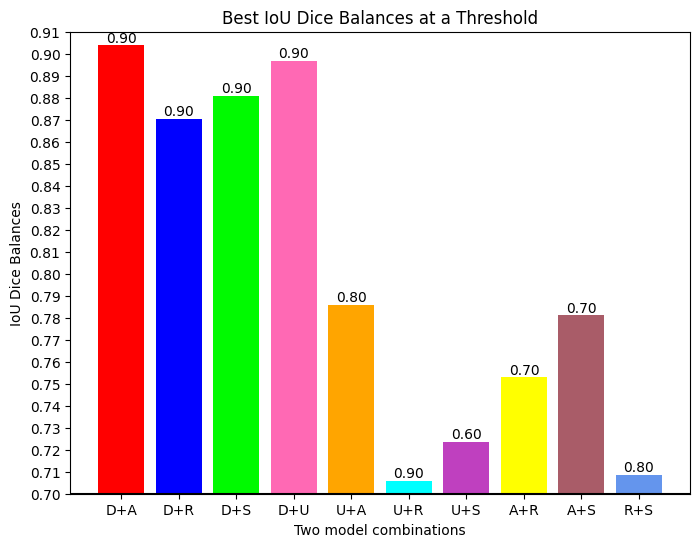

In [ ]:
import matplotlib.pyplot as plt

# Define the data
data = {
    'Threshold': results_df['Threshold'],
    'D+A': results_df['IoU_Dice_Balance_D+A'],
    'D+R': results_df['IoU_Dice_Balance_D+R'],
    'D+S': results_df['IoU_Dice_Balance_D+S'],
    'D+U': results_df['IoU_Dice_Balance_D+U'],
    'U+A': results_df['IoU_Dice_Balance_U+A'],
    'U+R': results_df['IoU_Dice_Balance_U+R'],
    'U+S': results_df['IoU_Dice_Balance_U+S'],
    'A+R': results_df['IoU_Dice_Balance_A+R'],
    'A+S': results_df['IoU_Dice_Balance_A+S'],
    'R+S': results_df['IoU_Dice_Balance_R+S'],

}

# Find the best values and corresponding thresholds for each IoU Dice balance
best_values = {}
for key in data.keys():
    if key != 'Threshold':
        best_idx = data[key].idxmax()
        best_values[key] = {'Threshold': data['Threshold'][best_idx], 'Value': data[key][best_idx]}
#        print(key,best_idx,best_values[key])
# Create a bar graph
plt.figure(figsize=(8, 6))

# Extract IoU Dice balance names and their best values
iou_dice_balances = best_values.keys()
best_iou_dice_values = [best_values[i]['Value'] for i in iou_dice_balances]
thresholds = [best_values[i]['Threshold'] for i in iou_dice_balances]

# Define colors for the bars
colors = ['red', 'blue', '#00fa00','#FF69B4',  'orange', 'cyan', '#BF40BF', 'yellow','#A95C68','#6495ED']
plt.bar(iou_dice_balances, best_iou_dice_values, color=colors)
plt.title("Best IoU Dice Balances at a Threshold")
plt.xlabel("Two model combinations")
plt.ylabel("IoU Dice Balances")

# Annotate thresholds above the bars
for i, value in enumerate(best_iou_dice_values):
    plt.text(i, value, f"{thresholds[i]:.2f}", ha='center', va='bottom')

plt.xticks(rotation= 0)

# Set y-axis limits from 0.8 to 1
plt.ylim(0.7, 0.91)
plt.yticks(np.arange(0.7, 0.91, 0.01))
# Add a kink from 0 to 0.8
plt.axhline(0.7, color='k')

plt.show()


After analyzing we can see we get best results after combining D+A at threshold 0.9

In [ ]:
thresholds = [1.7,1.6,1.5,1.4, 1.3, 1.2, 1.1, 1.0, 0.9, 0.8, 0.7, 0.6]
mean_iou_SAU_list = []
mean_dice_SAU_list = []
mean_iou_SAD_list = []
mean_dice_SAD_list = []
mean_iou_SAR_list = []
mean_dice_SAR_list = []
mean_iou_SUD_list = []
mean_dice_SUD_list = []
mean_iou_SUR_list = []
mean_dice_SUR_list = []
mean_iou_SDR_list = []
mean_dice_SDR_list = []
mean_iou_AUD_list = []
mean_dice_AUD_list = []
mean_iou_AUR_list = []
mean_dice_AUR_list = []
mean_iou_ADR_list = []
mean_dice_ADR_list = []
mean_iou_UDR_list = []
mean_dice_UDR_list = []

for j in thresholds:
    ensemble_pred_SAU = (unet_pred + att_pred + seg_net_pred) >= j
    ensemble_pred_SAD = (seg_net_pred + att_pred + deep3_pred) >= j
    ensemble_pred_SAR = (seg_net_pred + att_pred + res_unet_pred) >= j
    ensemble_pred_SUD = (seg_net_pred + unet_pred + deep3_pred) >= j
    ensemble_pred_SUR = (seg_net_pred + unet_pred + res_unet_pred) >= j
    ensemble_pred_SDR = (seg_net_pred + deep3_pred + res_unet_pred) >= j
    ensemble_pred_AUD = (unet_pred + att_pred + deep3_pred) >= j
    ensemble_pred_AUR = (unet_pred + att_pred + res_unet_pred) >= j
    ensemble_pred_ADR = (deep3_pred + att_pred + res_unet_pred) >= j
    ensemble_pred_UDR = (unet_pred + deep3_pred + res_unet_pred) >= j

    # Initialize lists for IoU and Dice Loss scores
    iou_scores_SAU = []
    dice_scores_SAU = []

    iou_scores_SAD = []
    dice_scores_SAD = []

    iou_scores_SAR = []
    dice_scores_SAR = []

    iou_scores_SUD = []
    dice_scores_SUD = []

    iou_scores_SUR = []
    dice_scores_SUR = []

    iou_scores_SDR = []
    dice_scores_SDR = []

    iou_scores_AUD = []
    dice_scores_AUD = []

    iou_scores_AUR = []
    dice_scores_AUR = []

    iou_scores_ADR = []
    dice_scores_ADR = []

    iou_scores_UDR = []
    dice_scores_UDR = []

    for i in range(len(scan_test)):
        iou_value_SAU = iou(ensemble_pred_SAU[i], mask_test[i])
        dice_SAU = dice_coeff(ensemble_pred_SAU[i], mask_test[i])
        iou_scores_SAU.append(iou_value_SAU)
        dice_scores_SAU.append(dice_SAU)

        iou_value_SAD = iou(ensemble_pred_SAD[i], mask_test[i])
        dice_SAD = dice_coeff(ensemble_pred_SAD[i], mask_test[i])
        iou_scores_SAD.append(iou_value_SAD)
        dice_scores_SAD.append(dice_SAD)

        iou_value_SAR = iou(ensemble_pred_SAR[i], mask_test[i])
        dice_SAR = dice_coeff(ensemble_pred_SAR[i], mask_test[i])
        iou_scores_SAR.append(iou_value_SAR)
        dice_scores_SAR.append(dice_SAR)

        iou_value_SUD = iou(ensemble_pred_SUD[i], mask_test[i])
        dice_SUD = dice_coeff(ensemble_pred_SUD[i], mask_test[i])
        iou_scores_SUD.append(iou_value_SUD)
        dice_scores_SUD.append(dice_SUD)

        iou_value_SUR = iou(ensemble_pred_SUR[i], mask_test[i])
        dice_SUR = dice_coeff(ensemble_pred_SUR[i], mask_test[i])
        iou_scores_SUR.append(iou_value_SUR)
        dice_scores_SUR.append(dice_SUR)

        iou_value_SDR = iou(ensemble_pred_SDR[i], mask_test[i])
        dice_SDR = dice_coeff(ensemble_pred_SDR[i], mask_test[i])
        iou_scores_SDR.append(iou_value_SDR)
        dice_scores_SDR.append(dice_SDR)

        iou_value_AUD = iou(ensemble_pred_AUD[i], mask_test[i])
        dice_AUD = dice_coeff(ensemble_pred_AUD[i], mask_test[i])
        iou_scores_AUD.append(iou_value_AUD)
        dice_scores_AUD.append(dice_AUD)

        iou_value_AUR = iou(ensemble_pred_AUR[i], mask_test[i])
        dice_AUR = dice_coeff(ensemble_pred_AUR[i], mask_test[i])
        iou_scores_AUR.append(iou_value_AUR)
        dice_scores_AUR.append(dice_AUR)

        iou_value_ADR = iou(ensemble_pred_ADR[i], mask_test[i])
        dice_ADR = dice_coeff(ensemble_pred_ADR[i], mask_test[i])
        iou_scores_ADR.append(iou_value_ADR)
        dice_scores_ADR.append(dice_ADR)

        iou_value_UDR = iou(ensemble_pred_UDR[i], mask_test[i])
        dice_UDR = dice_coeff(ensemble_pred_UDR[i], mask_test[i])
        iou_scores_UDR.append(iou_value_UDR)
        dice_scores_UDR.append(dice_UDR)

    # Calculate the mean IoU and Dice coefficient scores for each ensemble
    mean_iou_SAU = np.nanmean(iou_scores_SAU)
    mean_dice_SAU = np.mean(dice_scores_SAU)

    mean_iou_SAD = np.nanmean(iou_scores_SAD)
    mean_dice_SAD = np.mean(dice_scores_SAD)

    mean_iou_SAR = np.nanmean(iou_scores_SAR)
    mean_dice_SAR = np.mean(dice_scores_SAR)

    mean_iou_SUD = np.nanmean(iou_scores_SUD)
    mean_dice_SUD = np.mean(dice_scores_SUD)

    mean_iou_SUR = np.nanmean(iou_scores_SUR)
    mean_dice_SUR = np.mean(dice_scores_SUR)

    mean_iou_SDR = np.nanmean(iou_scores_SDR)
    mean_dice_SDR = np.mean(dice_scores_SDR)

    mean_iou_AUD = np.nanmean(iou_scores_AUD)
    mean_dice_AUD = np.mean(dice_scores_AUD)

    mean_iou_AUR = np.nanmean(iou_scores_AUR)
    mean_dice_AUR = np.mean(dice_scores_AUR)

    mean_iou_ADR = np.nanmean(iou_scores_ADR)
    mean_dice_ADR = np.mean(dice_scores_ADR)

    mean_iou_UDR = np.nanmean(iou_scores_UDR)
    mean_dice_UDR = np.mean(dice_scores_UDR)

    # Append the results to the lists
    mean_iou_SAU_list.append(mean_iou_SAU)
    mean_dice_SAU_list.append(mean_dice_SAU)
    mean_iou_SAD_list.append(mean_iou_SAD)
    mean_dice_SAD_list.append(mean_dice_SAD)
    mean_iou_SAR_list.append(mean_iou_SAR)
    mean_dice_SAR_list.append(mean_dice_SAR)
    mean_iou_SUR_list.append(mean_iou_SUR)
    mean_dice_SUR_list.append(mean_dice_SUR)
    mean_iou_SUD_list.append(mean_iou_SUD)
    mean_dice_SUD_list.append(mean_dice_SUD)
    mean_iou_SDR_list.append(mean_iou_SDR)
    mean_dice_SDR_list.append(mean_dice_SDR)
    mean_iou_AUD_list.append(mean_iou_AUD)
    mean_dice_AUD_list.append(mean_dice_AUD)
    mean_iou_AUR_list.append(mean_iou_AUR)
    mean_dice_AUR_list.append(mean_dice_AUR)
    mean_iou_ADR_list.append(mean_iou_ADR)
    mean_dice_ADR_list.append(mean_dice_ADR)
    mean_iou_UDR_list.append(mean_iou_UDR)
    mean_dice_UDR_list.append(mean_dice_UDR)

# Create a DataFrame from the lists
three_results_df = pd.DataFrame({
    'Threshold': thresholds,
    'Mean_IOU_S+A+U': mean_iou_SAU_list,
    'Mean_Dice_Coeff_S+A+U': mean_dice_SAU_list,
    'Mean_IOU_S+A+D': mean_iou_SAD_list,
    'Mean_Dice_Coeff_S+A+D': mean_dice_SAD_list,
    'Mean_IOU_S+A+R': mean_iou_SAR_list,
    'Mean_Dice_Coeff_S+A+R': mean_dice_SAR_list,
    'Mean_IOU_S+U+R': mean_iou_SUR_list,
    'Mean_Dice_Coeff_S+U+R': mean_dice_SUR_list,
    'Mean_IOU_S+U+D': mean_iou_SUD_list,
    'Mean_Dice_Coeff_S+U+D': mean_dice_SUD_list,
    'Mean_IOU_S+D+R': mean_iou_SDR_list,
    'Mean_Dice_Coeff_S+D+R': mean_dice_SDR_list,
    'Mean_IOU_A+U+D': mean_iou_AUD_list,
    'Mean_Dice_Coeff_A+U+D': mean_dice_AUD_list,
    'Mean_IOU_A+U+R': mean_iou_AUR_list,
    'Mean_Dice_Coeff_A+U+R': mean_dice_AUR_list,
    'Mean_IOU_A+D+R': mean_iou_ADR_list,
    'Mean_Dice_Coeff_A+D+R': mean_dice_ADR_list,
    'Mean_IOU_U+D+R': mean_iou_UDR_list,
    'Mean_Dice_Coeff_U+D+R': mean_dice_UDR_list,
})

In [ ]:
three_results_df

,Threshold,Mean_IOU_S+A+U,Mean_Dice_Coeff_S+A+U,Mean_IOU_S+A+D,Mean_Dice_Coeff_S+A+D,Mean_IOU_S+A+R,Mean_Dice_Coeff_S+A+R,Mean_IOU_S+U+R,Mean_Dice_Coeff_S+U+R,Mean_IOU_S+U+D,...,Mean_IOU_S+D+R,Mean_Dice_Coeff_S+D+R,Mean_IOU_A+U+D,Mean_Dice_Coeff_A+U+D,Mean_IOU_A+U+R,Mean_Dice_Coeff_A+U+R,Mean_IOU_A+D+R,Mean_Dice_Coeff_A+D+R,Mean_IOU_U+D+R,Mean_Dice_Coeff_U+D+R
0,1.7,0.661710,0.749985,0.778422,0.858079,0.666831,0.750094,0.638095,0.728564,0.722848,...,0.721628,0.802441,0.791756,0.863250,0.688140,0.775443,0.769071,0.844916,0.739364,0.812609
1,1.6,0.679109,0.765653,0.798465,0.874360,0.677886,0.761232,0.655574,0.744824,0.748972,...,0.735570,0.814238,0.806259,0.874958,0.697814,0.783728,0.785026,0.859718,0.754174,0.827013
2,1.5,0.695555,0.781963,0.813087,0.885523,0.686213,0.769641,0.669127,0.756775,0.771823,...,0.748130,0.824452,0.820523,0.888751,0.705778,0.790782,0.799414,0.872537,0.766575,0.840540
3,1.4,0.706607,0.793058,0.823143,0.893319,0.692397,0.776074,0.675534,0.764191,0.786916,...,0.758554,0.833154,0.833135,0.900903,0.711287,0.796094,0.807500,0.881049,0.778390,0.852270
4,1.3,0.714557,0.802175,0.832788,0.900831,0.699684,0.784695,0.680649,0.770774,0.797130,...,0.768252,0.841843,0.844247,0.911667,0.714852,0.800493,0.815246,0.888714,0.789454,0.864320
5,1.2,0.724651,0.812834,0.840004,0.907942,0.705660,0.791980,0.683028,0.773938,0.805279,...,0.773421,0.847689,0.847977,0.914990,0.714933,0.802638,0.824893,0.897944,0.794711,0.871444
6,1.1,0.729569,0.819683,0.844118,0.911905,0.710546,0.798151,0.683241,0.775171,0.816106,...,0.780651,0.856518,0.845705,0.913642,0.712329,0.802556,0.828994,0.902311,0.799235,0.877608
7,1.0,0.729097,0.820583,0.841292,0.909993,0.711163,0.800289,0.680708,0.774550,0.823396,...,0.810518,0.888812,0.839187,0.909248,0.708393,0.801790,0.827751,0.900931,0.805777,0.885577
8,0.9,0.723984,0.818509,0.828039,0.900593,0.710560,0.803132,0.673055,0.769825,0.814187,...,0.798870,0.879671,0.825051,0.899971,0.699612,0.796775,0.816109,0.891818,0.795091,0.877458
9,0.8,0.715307,0.814425,0.814313,0.891300,0.703809,0.801117,0.658930,0.759712,0.798318,...,0.781461,0.865721,0.800841,0.883188,0.687787,0.789551,0.797886,0.878029,0.774209,0.860915


In [ ]:
results2_df = pd.DataFrame({
    'Threshold': three_results_df['Threshold'],
    'IoU_Dice_Balance_S+A+U': (three_results_df['Mean_IOU_S+A+U'] + (three_results_df['Mean_Dice_Coeff_S+A+U'])) / 2,
    'IoU_Dice_Balance_S+A+D': (three_results_df['Mean_IOU_S+A+D'] + (three_results_df['Mean_Dice_Coeff_S+A+D'])) / 2,
    'IoU_Dice_Balance_S+A+R': (three_results_df['Mean_IOU_S+A+R'] + (three_results_df['Mean_Dice_Coeff_S+A+R'])) / 2,
    'IoU_Dice_Balance_S+U+D': (three_results_df['Mean_IOU_S+U+D'] + (three_results_df['Mean_Dice_Coeff_S+U+D'])) / 2,
    'IoU_Dice_Balance_S+U+R': (three_results_df['Mean_IOU_S+U+R'] + (three_results_df['Mean_Dice_Coeff_S+U+R'])) / 2,
    'IoU_Dice_Balance_S+D+R': (three_results_df['Mean_IOU_S+D+R'] + (three_results_df['Mean_Dice_Coeff_S+D+R'])) / 2,
    'IoU_Dice_Balance_A+U+D': (three_results_df['Mean_IOU_A+U+D'] + (three_results_df['Mean_Dice_Coeff_A+U+D'])) / 2,
    'IoU_Dice_Balance_A+U+R': (three_results_df['Mean_IOU_A+U+R'] + (three_results_df['Mean_Dice_Coeff_A+U+R'])) / 2,
    'IoU_Dice_Balance_A+D+R': (three_results_df['Mean_IOU_A+D+R'] + (three_results_df['Mean_Dice_Coeff_A+D+R'])) / 2,
    'IoU_Dice_Balance_U+D+R': (three_results_df['Mean_IOU_U+D+R'] + (three_results_df['Mean_Dice_Coeff_U+D+R'])) / 2,
})


In [ ]:
results2_df

,Threshold,IoU_Dice_Balance_S+A+U,IoU_Dice_Balance_S+A+D,IoU_Dice_Balance_S+A+R,IoU_Dice_Balance_S+U+D,IoU_Dice_Balance_S+U+R,IoU_Dice_Balance_S+D+R,IoU_Dice_Balance_A+U+D,IoU_Dice_Balance_A+U+R,IoU_Dice_Balance_A+D+R,IoU_Dice_Balance_U+D+R
0,1.7,0.705848,0.818251,0.708462,0.762919,0.683329,0.762035,0.827503,0.731792,0.806993,0.775987
1,1.6,0.722381,0.836412,0.719559,0.788678,0.700199,0.774904,0.840608,0.740771,0.822372,0.790593
2,1.5,0.738759,0.849305,0.727927,0.810313,0.712951,0.786291,0.854637,0.748280,0.835976,0.803558
3,1.4,0.749832,0.858231,0.734235,0.824274,0.719862,0.795854,0.867019,0.753690,0.844274,0.815330
4,1.3,0.758366,0.866809,0.742190,0.834522,0.725712,0.805048,0.877957,0.757673,0.851980,0.826887
5,1.2,0.768742,0.873973,0.748820,0.842598,0.728483,0.810555,0.881483,0.758786,0.861419,0.833078
6,1.1,0.774626,0.878011,0.754348,0.852462,0.729206,0.818585,0.879673,0.757442,0.865653,0.838422
7,1.0,0.774840,0.875642,0.755726,0.860352,0.727629,0.849665,0.874217,0.755091,0.864341,0.845677
8,0.9,0.771247,0.864316,0.756846,0.852211,0.721440,0.839271,0.862511,0.748194,0.853963,0.836275
9,0.8,0.764866,0.852806,0.752463,0.838618,0.709321,0.823591,0.842015,0.738669,0.837957,0.817562


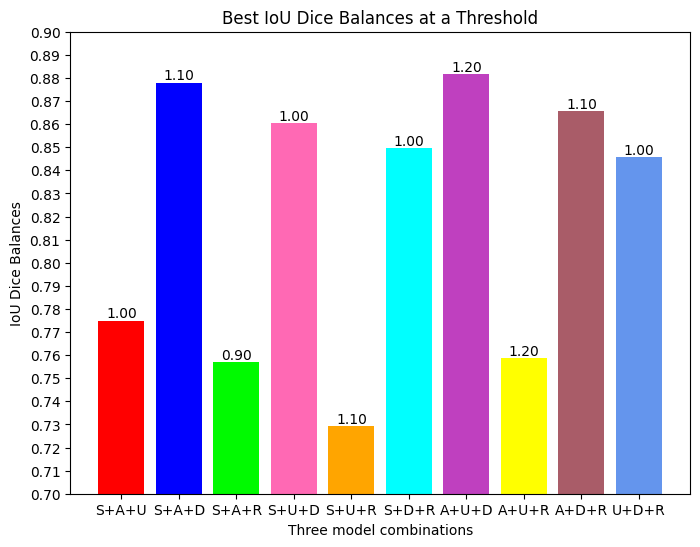

In [ ]:
import matplotlib.pyplot as plt

# Define the new data
data = {
    'Threshold': [1.7, 1.6, 1.5, 1.4, 1.3, 1.2, 1.1, 1.0, 0.9, 0.8, 0.7, 0.6],
    'S+A+U': results2_df['IoU_Dice_Balance_S+A+U'],
    'S+A+D': results2_df['IoU_Dice_Balance_S+A+D'],
    'S+A+R': results2_df['IoU_Dice_Balance_S+A+R'],
    'S+U+D': results2_df['IoU_Dice_Balance_S+U+D'],
    'S+U+R': results2_df['IoU_Dice_Balance_S+U+R'],
    'S+D+R': results2_df['IoU_Dice_Balance_S+D+R'],
    'A+U+D': results2_df['IoU_Dice_Balance_A+U+D'],
    'A+U+R': results2_df['IoU_Dice_Balance_A+U+R'],
    'A+D+R': results2_df['IoU_Dice_Balance_A+D+R'],
    'U+D+R': results2_df['IoU_Dice_Balance_U+D+R'],
}

# Find the best values and corresponding thresholds for each IoU Dice balance
best_values = {}
for key in data.keys():
    if key != 'Threshold':
        best_idx = data[key].idxmax()
        best_values[key] = {'Threshold': data['Threshold'][best_idx], 'Value': data[key][best_idx]}

# Create a bar graph
plt.figure(figsize=(8, 6))

# Extract IoU Dice balance names and their best values
iou_dice_balances = best_values.keys()
best_iou_dice_values = [best_values[i]['Value'] for i in iou_dice_balances]
thresholds = [best_values[i]['Threshold'] for i in iou_dice_balances]

# Define colors for the bars
colors = ['red', 'blue', '#00fa00','#FF69B4',  'orange', 'cyan', '#BF40BF', 'yellow','#A95C68','#6495ED']

plt.bar(iou_dice_balances, best_iou_dice_values, color=colors)
plt.title("Best IoU Dice Balances at a Threshold")
plt.xlabel("Three model combinations")
plt.ylabel("IoU Dice Balances")

# Annotate thresholds above the bars
for i, value in enumerate(best_iou_dice_values):
    plt.text(i, value, f"{thresholds[i]:.2f}", ha='center', va='bottom')

plt.xticks(rotation= 0)

# Set y-axis limits from 0.8 to 1
plt.ylim(0.7, 0.9)
plt.yticks(np.arange(0.7, 0.9, 0.01))
# Add a kink from 0 to 0.8
plt.axhline(0., color='k')

plt.show()


Best combination is: S+A+D at threshold 1.3

In [ ]:
thresholds = [2.2,2.1,2.0,1.9,1.8,1.7,1.6,1.5,1.4, 1.3, 1.2, 1.1, 1.0, 0.9, 0.8, 0.7, 0.6]
mean_iou_SAUD_list = []
mean_dice_SAUD_list = []
mean_iou_SAUR_list = []
mean_dice_SAUR_list = []
mean_iou_SUDR_list = []
mean_dice_SUDR_list = []
mean_iou_SADR_list = []
mean_dice_SADR_list = []
mean_iou_AUDR_list = []
mean_dice_AUDR_list = []

for j in thresholds:
    ensemble_pred_SAUD = (unet_pred + att_pred + seg_net_pred + deep3_pred) >= j
    ensemble_pred_SAUR = (seg_net_pred + att_pred + res_unet_pred + unet_pred) >= j
    ensemble_pred_SUDR = (seg_net_pred + unet_pred + deep3_pred +res_unet_pred) >= j
    ensemble_pred_SADR = (seg_net_pred + deep3_pred + res_unet_pred +att_pred) >= j
    ensemble_pred_AUDR = (unet_pred + att_pred + deep3_pred + res_unet_pred) >= j

    # Initialize lists for IoU and Dice Loss scores
    iou_scores_SAUD = []
    dice_scores_SAUD = []

    iou_scores_SAUR = []
    dice_scores_SAUR = []

    iou_scores_SUDR = []
    dice_scores_SUDR = []

    iou_scores_SADR = []
    dice_scores_SADR = []

    iou_scores_AUDR = []
    dice_scores_AUDR = []

    for i in range(len(scan_test)):
        iou_value_SAUD = iou(ensemble_pred_SAUD[i], mask_test[i])
        dice_SAUD = dice_coeff(ensemble_pred_SAUD[i], mask_test[i])
        iou_scores_SAUD.append(iou_value_SAUD)
        dice_scores_SAUD.append(dice_SAUD)

        iou_value_SAUR = iou(ensemble_pred_SAUR[i], mask_test[i])
        dice_SAUR = dice_coeff(ensemble_pred_SAUR[i], mask_test[i])
        iou_scores_SAUR.append(iou_value_SAUR)
        dice_scores_SAUR.append(dice_SAUR)

        iou_value_SUDR = iou(ensemble_pred_SUDR[i], mask_test[i])
        dice_SUDR = dice_coeff(ensemble_pred_SUDR[i], mask_test[i])
        iou_scores_SUDR.append(iou_value_SUDR)
        dice_scores_SUDR.append(dice_SUDR)

        iou_value_SADR = iou(ensemble_pred_SADR[i], mask_test[i])
        dice_SADR = dice_coeff(ensemble_pred_SADR[i], mask_test[i])
        iou_scores_SADR.append(iou_value_SADR)
        dice_scores_SADR.append(dice_SADR)

        iou_value_AUDR = iou(ensemble_pred_AUDR[i], mask_test[i])
        dice_AUDR = dice_coeff(ensemble_pred_AUDR[i], mask_test[i])
        iou_scores_AUDR.append(iou_value_AUDR)
        dice_scores_AUDR.append(dice_AUDR)

    # Calculate the mean IoU and Dice coefficient scores for each ensemble
    mean_iou_SAUD = np.nanmean(iou_scores_SAUD)
    mean_dice_SAUD = np.mean(dice_scores_SAUD)

    mean_iou_SAUR = np.nanmean(iou_scores_SAUR)
    mean_dice_SAUR = np.mean(dice_scores_SAUR)

    mean_iou_SUDR = np.nanmean(iou_scores_SUDR)
    mean_dice_SUDR = np.mean(dice_scores_SUDR)

    mean_iou_SADR = np.nanmean(iou_scores_SADR)
    mean_dice_SADR = np.mean(dice_scores_SADR)

    mean_iou_AUDR = np.nanmean(iou_scores_AUDR)
    mean_dice_AUDR = np.mean(dice_scores_AUDR)

    # Append the results to the lists
    mean_iou_SAUD_list.append(mean_iou_SAUD)
    mean_dice_SAUD_list.append(mean_dice_SAUD)
    mean_iou_SAUR_list.append(mean_iou_SAUR)
    mean_dice_SAUR_list.append(mean_dice_SAUR)
    mean_iou_SUDR_list.append(mean_iou_SUDR)
    mean_dice_SUDR_list.append(mean_dice_SUDR)
    mean_iou_SADR_list.append(mean_iou_SADR)
    mean_dice_SADR_list.append(mean_dice_SADR)
    mean_iou_AUDR_list.append(mean_iou_AUDR)
    mean_dice_AUDR_list.append(mean_dice_AUDR)

# Create a DataFrame from the lists
four_results_df = pd.DataFrame({
    'Threshold': thresholds,
    'Mean_IOU_S+A+U+D': mean_iou_SAUD_list,
    'Mean_Dice_Coeff_S+A+U+D': mean_dice_SAUD_list,
    'Mean_IOU_S+A+U+R': mean_iou_SAUR_list,
    'Mean_Dice_Coeff_S+A+U+R': mean_dice_SAUR_list,
    'Mean_IOU_S+U+D+R': mean_iou_SUDR_list,
    'Mean_Dice_Coeff_S+U+D+R': mean_dice_SUDR_list,
    'Mean_IOU_S+A+D+R': mean_iou_SADR_list,
    'Mean_Dice_Coeff_S+A+D+R': mean_dice_SADR_list,
    'Mean_IOU_A+U+D+R': mean_iou_AUDR_list,
    'Mean_Dice_Coeff_A+U+D+R': mean_dice_AUDR_list,
})

In [ ]:
four_results_df

,Threshold,Mean_IOU_S+A+U+D,Mean_Dice_Coeff_S+A+U+D,Mean_IOU_S+A+U+R,Mean_Dice_Coeff_S+A+U+R,Mean_IOU_S+U+D+R,Mean_Dice_Coeff_S+U+D+R,Mean_IOU_S+A+D+R,Mean_Dice_Coeff_S+A+D+R,Mean_IOU_A+U+D+R,Mean_Dice_Coeff_A+U+D+R
0,2.2,0.753014,0.833605,0.674162,0.759498,0.716500,0.798774,0.737032,0.814629,0.753080,0.827637
1,2.1,0.770544,0.849564,0.685124,0.770728,0.729865,0.810614,0.749777,0.827000,0.763581,0.837356
2,2.0,0.786387,0.862539,0.693671,0.778906,0.743769,0.822867,0.763264,0.839830,0.773637,0.847199
3,1.9,0.798552,0.872657,0.703161,0.787586,0.756807,0.833748,0.775679,0.853136,0.782795,0.855989
4,1.8,0.807551,0.881407,0.708899,0.793049,0.765697,0.841977,0.788075,0.865884,0.792966,0.866873
5,1.7,0.814012,0.887120,0.714307,0.798242,0.772941,0.848474,0.797248,0.874751,0.797647,0.873276
6,1.6,0.818754,0.891390,0.716226,0.801005,0.775820,0.852461,0.803355,0.880154,0.800784,0.877684
7,1.5,0.820429,0.893483,0.717028,0.804294,0.775860,0.853869,0.806966,0.883345,0.803628,0.881689
8,1.4,0.821051,0.895339,0.714758,0.804428,0.773476,0.853539,0.806918,0.883248,0.805429,0.884805
9,1.3,0.817089,0.893652,0.712984,0.804806,0.771722,0.854608,0.805583,0.882709,0.804221,0.884934


In [ ]:
results4_df = pd.DataFrame({
    'Threshold': four_results_df['Threshold'],
    'IoU_Dice_Balance_S+A+U+D': (four_results_df['Mean_IOU_S+A+U+D'] + (four_results_df['Mean_Dice_Coeff_S+A+U+D'])) / 2,
    'IoU_Dice_Balance_S+A+U+R': (four_results_df['Mean_IOU_S+A+U+R'] + (four_results_df['Mean_Dice_Coeff_S+A+U+R'])) / 2,
    'IoU_Dice_Balance_S+U+D+R': (four_results_df['Mean_IOU_S+U+D+R'] + (four_results_df['Mean_Dice_Coeff_S+U+D+R'])) / 2,
    'IoU_Dice_Balance_S+A+D+R': (four_results_df['Mean_IOU_S+A+D+R'] + (four_results_df['Mean_Dice_Coeff_S+A+D+R'])) / 2,
    'IoU_Dice_Balance_A+U+D+R': (four_results_df['Mean_IOU_A+U+D+R'] + (four_results_df['Mean_Dice_Coeff_A+U+D+R'])) / 2,

})

In [ ]:
results4_df

,Threshold,IoU_Dice_Balance_S+A+U+D,IoU_Dice_Balance_S+A+U+R,IoU_Dice_Balance_S+U+D+R,IoU_Dice_Balance_S+A+D+R,IoU_Dice_Balance_A+U+D+R
0,2.2,0.793309,0.716830,0.757637,0.775830,0.790358
1,2.1,0.810054,0.727926,0.770240,0.788389,0.800469
2,2.0,0.824463,0.736289,0.783318,0.801547,0.810418
3,1.9,0.835605,0.745374,0.795277,0.814407,0.819392
4,1.8,0.844479,0.750974,0.803837,0.826980,0.829919
5,1.7,0.850566,0.756275,0.810708,0.835999,0.835461
6,1.6,0.855072,0.758615,0.814140,0.841755,0.839234
7,1.5,0.856956,0.760661,0.814864,0.845155,0.842658
8,1.4,0.858195,0.759593,0.813508,0.845083,0.845117
9,1.3,0.855370,0.758895,0.813165,0.844146,0.844577


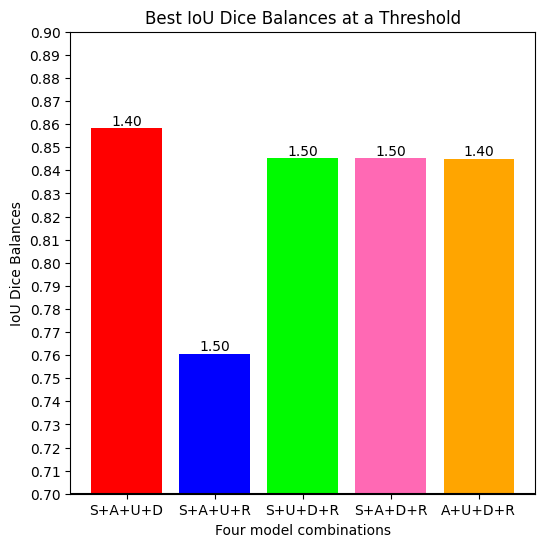

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the new data
data = {
    'Threshold': [2.2, 2.1, 2.0, 1.9, 1.8, 1.7, 1.6, 1.5, 1.4, 1.3, 1.2, 1.1, 1.0, 0.9, 0.8, 0.7, 0.6],
    'S+A+U+D': results4_df['IoU_Dice_Balance_S+A+U+D'],
    'S+A+U+R': results4_df['IoU_Dice_Balance_S+A+U+R'],
    'S+U+D+R': results4_df['IoU_Dice_Balance_S+A+D+R'],
    'S+A+D+R':results4_df['IoU_Dice_Balance_S+A+D+R'],
    'A+U+D+R': results4_df['IoU_Dice_Balance_A+U+D+R'],
}

# Find the best values and corresponding thresholds for each IoU Dice balance
best_values = {}
for key in data.keys():
    if key != 'Threshold':
        best_idx = data[key].idxmax()
        best_values[key] = {'Threshold': data['Threshold'][best_idx], 'Value': data[key][best_idx]}

# Create a bar graph
plt.figure(figsize=(6, 6))

# Extract IoU Dice balance names and their best values
iou_dice_balances = best_values.keys()
best_iou_dice_values = [best_values[i]['Value'] for i in iou_dice_balances]
thresholds = [best_values[i]['Threshold'] for i in iou_dice_balances]

# Define colors for the bars
colors = ['red', 'blue', '#00fa00','#FF69B4',  'orange']

plt.bar(iou_dice_balances, best_iou_dice_values, color=colors)
plt.title("Best IoU Dice Balances at a Threshold")
plt.xlabel("Four model combinations")
plt.ylabel("IoU Dice Balances")

# Annotate thresholds above the bars
for i, value in enumerate(best_iou_dice_values):
    plt.text(i, value, f"{thresholds[i]:.2f}", ha='center', va='bottom')

plt.xticks(rotation=0)

# Set y-axis limits from 0.7 to 0.9
plt.ylim(0.7, 0.9)
plt.yticks(np.arange(0.7, 0.9, 0.01))

# Add a kink from 0.7 to 0.9
plt.axhline(0.7, color='k')

plt.show()


In [ ]:
hresholds = [2.2,2.1,2.0,1.9,1.8,1.7,1.6,1.5,1.4, 1.3, 1.2, 1.1, 1.0, 0.9, 0.8, 0.7, 0.6]
mean_iou_SAUDR_list = []
mean_dice_SAUDR_list = []
IoU_Dice_Balance_SAUDR_list = []

for j in thresholds:
    ensemble_pred_SAUDR = (unet_pred + att_pred + seg_net_pred + res_unet_pred +deep3_pred) >= j
    iou_scores_SAUDR = []
    dice_scores_SAUDR = []

    for i in range(len(scan_test)):
        iou_value_SAUDR = iou(ensemble_pred_SAUDR[i], mask_test[i])
        dice_SAUDR = dice_coeff(ensemble_pred_SAUDR[i], mask_test[i])
        iou_scores_SAUDR.append(iou_value_SAUDR)
        dice_scores_SAUDR.append(dice_SAUDR)

    mean_iou_SAUDR = np.nanmean(iou_scores_SAUDR)
    mean_dice_SAUDR = np.mean(dice_scores_SAUDR)

    # Calculate the IoU-Dice balance for each ensemble and threshold
    IoU_Dice_Balance_SAUDR = (mean_iou_SAUDR + (mean_dice_SAUDR)) / 2

    # Append the results to the respective lists
    IoU_Dice_Balance_SAUDR_list.append(IoU_Dice_Balance_SAUDR)

    # Append the results to the lists
    mean_iou_SAUDR_list.append(mean_iou_SAUDR)
    mean_dice_SAUDR_list.append(mean_dice_SAUDR)

# Create a DataFrame from the lists
SAUDR_results_df = pd.DataFrame({
    'Threshold': thresholds,
    'Mean_IOU_S+A+U+D+R': mean_iou_SAUDR_list,
    'Mean_Dice_Coeff_S+A+U+D+R': mean_dice_SAUDR_list,
    'IoU_Dice_Balance_S+A+U+D+R': IoU_Dice_Balance_SAUDR_list
})


In [ ]:
SAUDR_results_df

,Threshold,Mean_IOU_S+A+U+D+R,Mean_Dice_Coeff_S+A+U+D+R,IoU_Dice_Balance_S+A+U+D+R
0,2.2,0.776605,0.853253,0.814929
1,2.1,0.782241,0.859242,0.820742
2,2.0,0.787372,0.864517,0.825945
3,1.9,0.790419,0.868137,0.829278
4,1.8,0.792288,0.871740,0.832014
5,1.7,0.792786,0.873233,0.833009
6,1.6,0.790806,0.872796,0.831801
7,1.5,0.787579,0.871010,0.829295
8,1.4,0.782505,0.868455,0.825480
9,1.3,0.775363,0.863830,0.819597


Best Result is at threshold 2.1

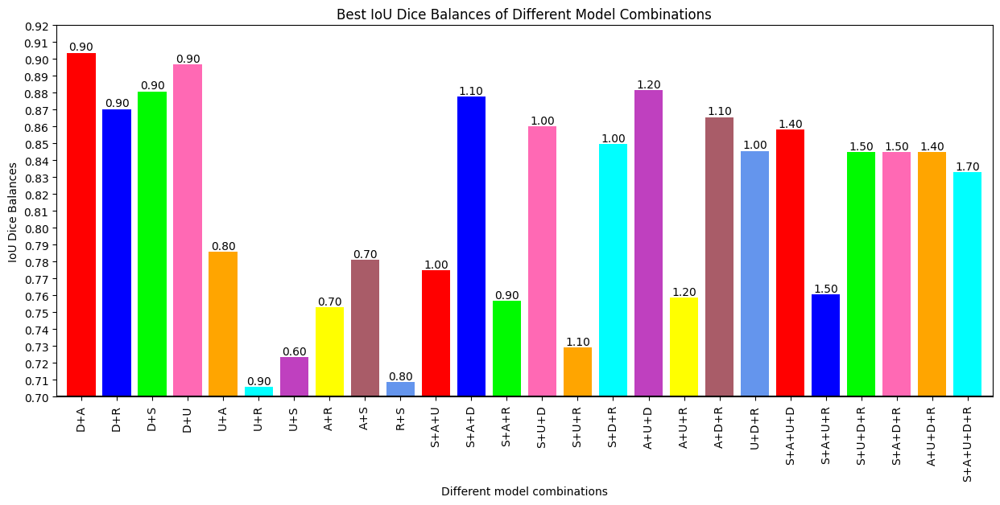

In [ ]:
import matplotlib.pyplot as plt

# Define the data
data1 = {
    'Threshold': results_df['Threshold'],
    'D+A': results_df['IoU_Dice_Balance_D+A'],
    'D+R': results_df['IoU_Dice_Balance_D+R'],
    'D+S': results_df['IoU_Dice_Balance_D+S'],
    'D+U': results_df['IoU_Dice_Balance_D+U'],
    'U+A': results_df['IoU_Dice_Balance_U+A'],
    'U+R': results_df['IoU_Dice_Balance_U+R'],
    'U+S': results_df['IoU_Dice_Balance_U+S'],
    'A+R': results_df['IoU_Dice_Balance_A+R'],
    'A+S': results_df['IoU_Dice_Balance_A+S'],
    'R+S': results_df['IoU_Dice_Balance_R+S']
}
data2 = {
      'Threshold': results2_df['Threshold'],
        'S+A+U': results2_df['IoU_Dice_Balance_S+A+U'],
      'S+A+D': results2_df['IoU_Dice_Balance_S+A+D'],
      'S+A+R': results2_df['IoU_Dice_Balance_S+A+R'],
      'S+U+D': results2_df['IoU_Dice_Balance_S+U+D'],
      'S+U+R': results2_df['IoU_Dice_Balance_S+U+R'],
      'S+D+R': results2_df['IoU_Dice_Balance_S+D+R'],
      'A+U+D': results2_df['IoU_Dice_Balance_A+U+D'],
      'A+U+R': results2_df['IoU_Dice_Balance_A+U+R'],
      'A+D+R': results2_df['IoU_Dice_Balance_A+D+R'],
      'U+D+R': results2_df['IoU_Dice_Balance_U+D+R']
}
data3 = {
      'Threshold': results4_df['Threshold'],
      'S+A+U+D': results4_df['IoU_Dice_Balance_S+A+U+D'],
    'S+A+U+R': results4_df['IoU_Dice_Balance_S+A+U+R'],
    'S+U+D+R': results4_df['IoU_Dice_Balance_S+A+D+R'],
    'S+A+D+R':results4_df['IoU_Dice_Balance_S+A+D+R'],
    'A+U+D+R': results4_df['IoU_Dice_Balance_A+U+D+R'],
    'S+A+U+D+R':SAUDR_results_df['IoU_Dice_Balance_S+A+U+D+R']

}

# Find the best values and corresponding thresholds for each IoU Dice balance
best_values = {}
for key in data1.keys():
    if key != 'Threshold':
        best_idx = data1[key].idxmax()
        best_values[key] = {'Threshold': data1['Threshold'][best_idx], 'Value': data1[key][best_idx]}
for key in data2.keys():
    if key != 'Threshold':
        best_idx = data2[key].idxmax()
        best_values[key] = {'Threshold': data2['Threshold'][best_idx], 'Value': data2[key][best_idx]}
for key in data3.keys():
    if key != 'Threshold':
        best_idx = data3[key].idxmax()
        best_values[key] = {'Threshold': data3['Threshold'][best_idx], 'Value': data3[key][best_idx]}

plt.figure(figsize=(15, 6))

# Extract IoU Dice balance names and their best values
iou_dice_balances = best_values.keys()
best_iou_dice_values = [best_values[i]['Value'] for i in iou_dice_balances]
thresholds = [best_values[i]['Threshold'] for i in iou_dice_balances]

# Define colors for the bars
colors = ['red', 'blue', '#00fa00','#FF69B4',  'orange', 'cyan', '#BF40BF', 'yellow','#A95C68','#6495ED']
plt.bar(iou_dice_balances, best_iou_dice_values, color=colors)
plt.title("Best IoU Dice Balances of Different Model Combinations")
plt.xlabel("Different model combinations")
plt.ylabel("IoU Dice Balances")

# Annotate thresholds above the bars
#for i, value in enumerate(best_iou_dice_values):
#    plt.text(i, value, f"{thresholds[i]:.2f}", ha='center', va='bottom')
for i, value in enumerate(best_iou_dice_values):
    plt.text(i, value,f"{thresholds[i]:.2f}", ha='center', va='bottom')

plt.xticks(rotation= 90)
plt.xlim(-0.7, len(iou_dice_balances) - 0.3)
# Set y-axis limits from 0.8 to 1
plt.ylim(0.7, 0.92)
plt.yticks(np.arange(0.7, 0.92, 0.01))
# Add a kink from 0 to 0.8
plt.axhline(0.7, color='k')

plt.show()

## Plotting results

In [ ]:
ensemble_pred = (deep3_pred + att_pred ) >= 0.9

In [ ]:
iou_scores = []
dice_coefficient = []

for i in range(len(scan_test)):
    iou_value = iou(ensemble_pred[i],mask_test[i])
    dice = dice_coeff(ensemble_pred[i],mask_test[i])
    iou_scores.append(iou_value)
    dice_coefficient.append(dice)

# Calculate the mean IoU and Dice coefficient scores
mean_iou_ensemble = np.nanmean(iou_scores)  # Use np.nanmean to handle NaN values
mean_dice_ensemble = np.mean(dice_coefficient)

print(f"Mean IoU: {mean_iou_ensemble}")
print(f"Mean Dice coefficient: {mean_dice_ensemble}")


Mean IoU: 0.8800443772696833
Mean Dice coefficient: 0.9293051958084106


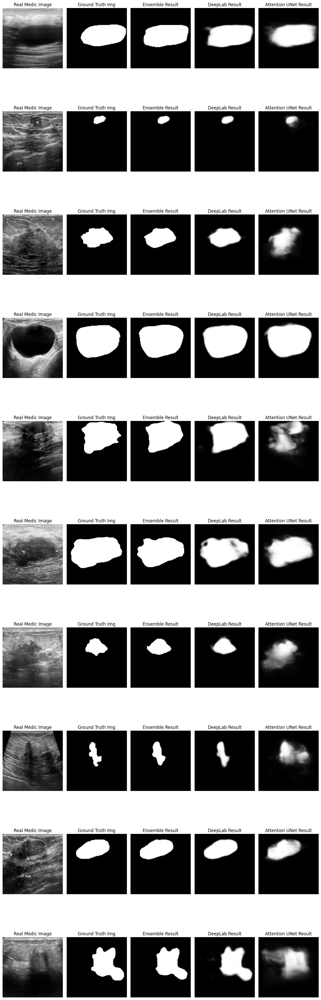

In [ ]:
plt.figure(figsize=(15, 60))  # Adjust the figsize as needed

i = 0
x = 0
while i < 60:
    plt.subplot(15, 6, i + 1)
    plt.imshow(scan_test[x], 'gray')
    plt.title('Real Medic Image')
    plt.axis('off')

    plt.subplot(15, 6, i + 2)
    plt.imshow(mask_test[x], 'gray')
    plt.title('Ground Truth Img')
    plt.axis('off')

    plt.subplot(15, 6, i + 3)
    plt.imshow(ensemble_pred[x], 'gray')
    plt.title('Ensemble Result')
    plt.axis('off')

    plt.subplot(15, 6, i + 4)
    plt.imshow(deep3_pred[x], 'gray')
    plt.title('DeepLab Result')
    plt.axis('off')

    plt.subplot(15, 6, i + 5)
    plt.imshow(att_pred[x], 'gray')
    plt.title('Attention UNet Result')
    plt.axis('off')

    x += 1
    i += 6

plt.tight_layout()
plt.show()


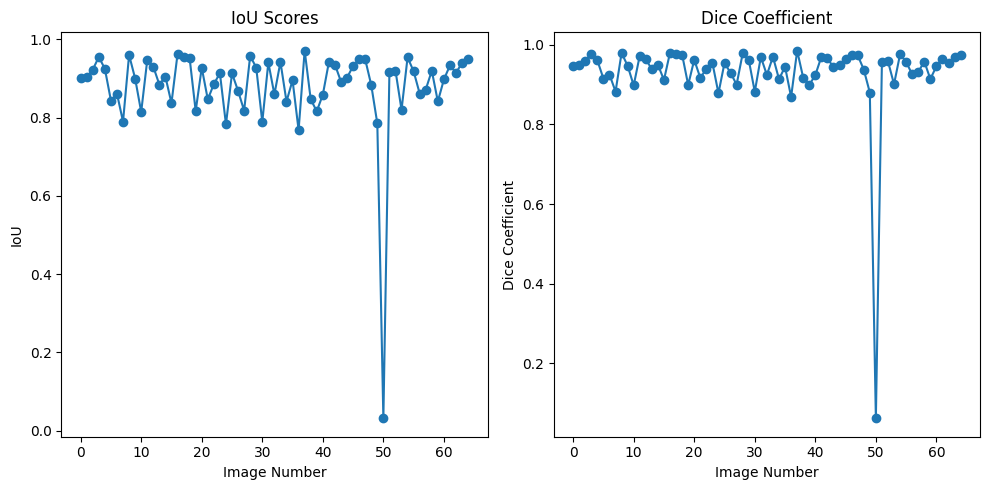

In [ ]:
indices = range(len(iou_scores))

# Plot IoU scores
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(indices, iou_scores, marker='o', linestyle='-')
plt.title('IoU Scores')
plt.xlabel('Image Number')
plt.ylabel('IoU')

# Plot Dice scores
plt.subplot(1, 2, 2)
plt.plot(indices, dice_coefficient, marker='o', linestyle='-')
plt.title('Dice Coefficient')
plt.xlabel('Image Number')
plt.ylabel('Dice Coefficient')

plt.tight_layout()
plt.show()


# Final Results


In [ ]:
image_path = [
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/benign/benign (110).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/benign/benign (100).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/benign/benign (101).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/benign/benign (107).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/normal/normal (101).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/normal/normal (111).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/normal/normal (106).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/malignant/malignant (115).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/malignant/malignant (111).png',
    '/content/drive/MyDrive/Dataset_BUSI_with_GT/malignant/malignant (110).png',
]

In [ ]:
testX = []
for img in image_path :
    testX.append(img_to_array(Image.fromarray(cv2.resize(cv2.imread(img, cv2.IMREAD_GRAYSCALE), (128,128)))))

In [ ]:
testX = np.array(testX)
testX/= 255.0

In [ ]:
print(testX.shape)
print(f'Minimum : {testX.min()}')
print(f'Maximum : {testX.max()}')

(10, 128, 128, 1)
Minimum : 0.0
Maximum : 1.0


(-0.5, 127.5, 127.5, -0.5)

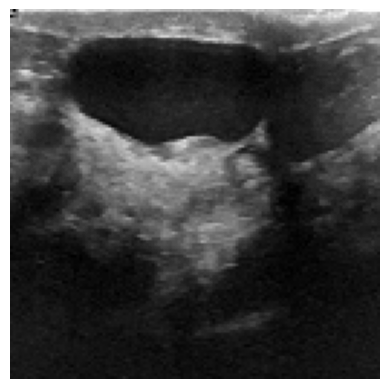

In [ ]:
plt.imshow(testX[0], 'gray')
plt.axis('off')

In [ ]:
predY = att_model.predict(testX)

1/1 [==============================] - 2s 2s/step


In [ ]:
print(predY.shape)

(10, 128, 128, 1)


(-0.5, 127.5, 127.5, -0.5)

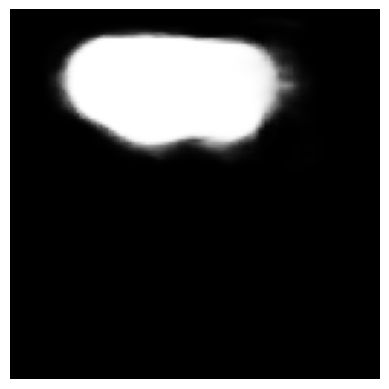

In [ ]:
plt.imshow(predY[0], 'gray')
plt.axis('off')

In [ ]:
print(predY.min())
print(predY.max())

0.0
0.9999999


In [ ]:
colored_predY = []
for i in range(len(predY)):
    colored_img = greytocolor(predY[i])
    colored_predY.append(colored_img)
colored_predY = np.array(colored_predY)

In [ ]:
pred_label = vgg16_model.predict(colored_predY)

1/1 [==============================] - 1s 923ms/step


In [ ]:
pred_label.shape

(10, 3)

[2 2 2 2 0 0 0 1 1 1]


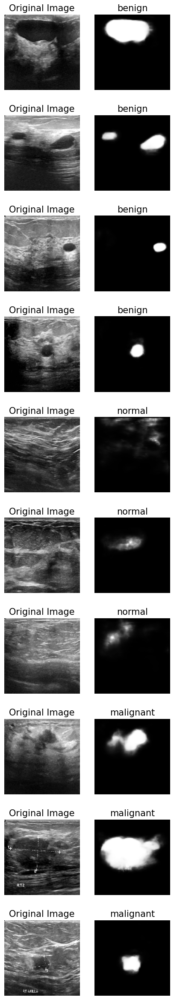

In [ ]:
print(np.argmax(pred_label, axis = 1))
plt.figure(figsize = (5,30))

i = 0
j = 0
while i < 20 :

    plt.subplot(10,2,i+1)
    plt.imshow (testX[j], 'gray')
    plt.title('Original Image', fontsize = 15)
    plt.axis('off')

    plt.subplot(10,2,i+2)
    plt.imshow (predY[j], 'gray')
    plt.title(f'{info[np.argmax(pred_label[j])]}', fontsize = 15)
    plt.axis('off')

    j += 1
    i += 2
plt.show()

In [ ]:
print(np.argmax(colored_predY, axis = 1))

[2 2 2 2 0 0 0 1 1 1]
